# Introduction to Data Science - Assignment 3
---

# Prerequisites

In [ ]:
from IPython.display import display, HTML
import os, sys
display(HTML('<style>pre { white-space: pre !important; }</style>'))
os.environ['PYSPARK_DRIVER_PYTHON_OPTS']= "notebook"
os.environ['PYSPARK_DRIVER_PYTHON'] = sys.executable
os.environ['PYSPARK_PYTHON'] = sys.executable

In [ ]:
from pyspark.sql import SparkSession
import pyspark.sql.functions as Utils
from pyspark.sql import DataFrame
import seaborn as sns
from seaborn import diverging_palette

# Warm UP



In [ ]:
def summerize(data: DataFrame, n = 1):
    row_count = data.count()
    if(n == -1):
        n = row_count
    print('Number of rows:', row_count)
    data.show(n, truncate=False)

spark = SparkSession.builder.getOrCreate()

**1. Read the csv file correctly!**

In [ ]:
data = spark.read.csv('stocks.csv', header=True, inferSchema=True)

**2. Find out about the schema of data.**

In [ ]:
data.printSchema()
data.describe().show()
summerize(data)

root
 |-- Date: date (nullable = true)
 |-- Open: double (nullable = true)
 |-- High: double (nullable = true)
 |-- Low: double (nullable = true)
 |-- Close: double (nullable = true)
 |-- Volume: integer (nullable = true)
 |-- Adj Close: double (nullable = true)

+-------+------------------+------------------+------------------+-----------------+-------------------+------------------+
|summary|              Open|              High|               Low|            Close|             Volume|         Adj Close|
+-------+------------------+------------------+------------------+-----------------+-------------------+------------------+
|  count|              1762|              1762|              1762|             1762|               1762|              1762|
|   mean| 313.0763111589103| 315.9112880164581| 309.8282405079457|312.9270656379113|9.422577587968218E7| 75.00174115607275|
| stddev|185.29946803981522|186.89817686485767|183.38391664371008|185.1471036170943|6.020518776592709E7| 28.57492972

**3. For those records with closing price less than 500, select opening, closing and volume and show them.**

In [ ]:
closeLessThan500 = data.select('Open', 'Close', 'Volume').filter(Utils.col('Close') < 500)
summerize(closeLessThan500)

Number of rows: 1359
+----------+----------+---------+
|      Open|     Close|   Volume|
+----------+----------+---------+
|213.429998|214.009998|123432400|
+----------+----------+---------+
only showing top 1 row



**4. Find out records with opening price more than 200 and closing price less than 200.**

In [ ]:
closeLessThan200andOpenMoreThan200 = data.filter((Utils.col('Open') > 200) & (Utils.col('Close') < 200))
summerize(closeLessThan200andOpenMoreThan200)

Number of rows: 3
+----------+------------------+----------+------+------+---------+---------+
|      Date|              Open|      High|   Low| Close|   Volume|Adj Close|
+----------+------------------+----------+------+------+---------+---------+
|2010-01-22|206.78000600000001|207.499996|197.16|197.75|220441900|25.620401|
+----------+------------------+----------+------+------+---------+---------+
only showing top 1 row



**5. Extract the year from the date and save it in a new column.**

In [ ]:
dataWithYear = data.withColumn('Year', Utils.year('Date'))

summerize(dataWithYear)

Number of rows: 1762
+----------+----------+----------+------------------+----------+---------+---------+----+
|      Date|      Open|      High|               Low|     Close|   Volume|Adj Close|Year|
+----------+----------+----------+------------------+----------+---------+---------+----+
|2010-01-04|213.429998|214.499996|212.38000099999996|214.009998|123432400|27.727039|2010|
+----------+----------+----------+------------------+----------+---------+---------+----+
only showing top 1 row



**6. Now, for each year, show the minimum volumes traded, shown in a column named `minVolume`.**

In [ ]:
minVol = dataWithYear.groupBy('Year').agg(Utils.min('Volume').alias('MinVolume'))
summerize(minVol, -1)

Number of rows: 7
+----+---------+
|Year|MinVolume|
+----+---------+
|2015| 13046400|
|2013| 41888700|
|2014| 14479600|
|2012| 43938300|
|2016| 11475900|
|2010| 39373600|
|2011| 44915500|
+----+---------+



**7. Follow quite the same procedure as the previous step, but now for each year and month, show the highest low price, shown in a column named `maxLow`.**

In [ ]:
dataWithYearAndMonth = dataWithYear.withColumn('Month', Utils.month('Date'))
highestLow = dataWithYearAndMonth.groupBy('Year', 'Month').agg(Utils.max('Low').alias('HighestLow'))
sortedHighestLow = highestLow.orderBy(Utils.col('Year'), Utils.col('Month'))
summerize(sortedHighestLow, -1)

Number of rows: 84
+----+-----+------------------+
|Year|Month|        HighestLow|
+----+-----+------------------+
|2010|    1|        213.249994|
|2010|    2|        202.000004|
|2010|    3|        234.459999|
|2010|    4|268.19001000000003|
|2010|    5|        262.880009|
|2010|    6|        271.499992|
|2010|    7|        260.300003|
|2010|    8|        260.549995|
|2010|    9|        291.009998|
|2010|   10|        314.289997|
|2010|   11|        316.759987|
|2010|   12|        325.099991|
|2011|    1|        344.440006|
|2011|    2|             360.5|
|2011|    3|        357.750004|
|2011|    4|        350.300007|
|2011|    5|        346.880009|
|2011|    6|        344.649998|
|2011|    7|399.67998900000003|
|2011|    8|        392.369995|
|2011|    9|        412.000004|
|2011|   10|        415.990002|
|2011|   11|        401.560005|
|2011|   12|        403.490009|
|2012|    1|453.07002300000005|
|2012|    2|        535.700005|
|2012|    3| 610.3099900000001|
|2012|    4| 626.0000

**8. For the last step, calculate mean and standard deviation of high price over the whole data frame and show them in two decimal places.**

In [ ]:
mean_value = data.agg(Utils.mean('High').alias('mean')).first()['mean']
std_value = data.agg(Utils.stddev('High').alias('std')).first()['std']

print(f'Mean: {mean_value:.2f}')
print(f'Standard Deviation: {std_value:.2f}')

Mean: 315.91
Standard Deviation: 186.90


# Main Task

## 1. Initializtion and First Look

In [ ]:
spark = SparkSession.builder.getOrCreate()
data = spark.read.parquet('spotify.parquet')

In [ ]:
data.printSchema()

summerize(data)

root
 |-- id: string (nullable = true)
 |-- name: string (nullable = true)
 |-- album: string (nullable = true)
 |-- album_id: string (nullable = true)
 |-- artists: string (nullable = true)
 |-- artist_ids: string (nullable = true)
 |-- track_number: long (nullable = true)
 |-- disc_number: long (nullable = true)
 |-- explicit: boolean (nullable = true)
 |-- danceability: double (nullable = true)
 |-- energy: double (nullable = true)
 |-- key: long (nullable = true)
 |-- loudness: double (nullable = true)
 |-- mode: long (nullable = true)
 |-- speechiness: double (nullable = true)
 |-- acousticness: double (nullable = true)
 |-- instrumentalness: double (nullable = true)
 |-- liveness: double (nullable = true)
 |-- valence: double (nullable = true)
 |-- tempo: double (nullable = true)
 |-- duration_ms: long (nullable = true)
 |-- time_signature: double (nullable = true)
 |-- year: long (nullable = true)
 |-- release_date: string (nullable = true)

Number of rows: 1204025
+------------

- `id`: A unique identifier for each track in the dataset.

- `name`: The name of the track.

- `album`: The name of the album that the track belongs to.

- `album_id`: A unique identifier for the album that the track belongs to.

- `artists`: The name of the artist or artists who performed the track. Multiple artists are separated by commas.

- `artist_ids`: Unique identifiers for the artist or artists who performed the track. Multiple artist IDs are - separated by commas.

- `track_number`: The position of the track on its corresponding album.

- `disc_number`: The disc number that the track belongs to. For albums with multiple discs, this indicates the disc on which the track appears.

- `explicit`: A boolean value indicating whether the track contains explicit content[any tracks with profanity or mature/suggestive themes] or not.

- `danceability`: A measure of how suitable a track is for dancing, ranging from 0 to 1.

- `energy`: A measure of the intensity and activity of a track, ranging from 0 to 1.

- `key`: The key of the track, represented as an integer value. Each integer corresponds to a specific musical key.

- `loudness`: The overall loudness of the track in decibels (dB).

- `mode`: The modality of the track, represented as an integer value. 0 represents a minor mode, and 1 represents a major mode.

- `speechiness`: A measure of the presence of spoken words in a track, ranging from 0 to 1. Values above 0.66 generally indicate tracks with spoken words, while values below 0.33 indicate instrumental tracks.

- `acousticness`: A measure of the acoustic quality of a track, ranging from 0 to 1. Higher values indicate a higher likelihood of the track being acoustic.

- `instrumentalness`: A measure of the likelihood that the track is instrumental, ranging from 0 to 1. Higher values indicate a higher likelihood of the track being instrumental.

- `liveness`: A measure of the presence of a live audience in a track, ranging from 0 to 1. Values above 0.8 generally indicate the track was recorded live.

- `valence`: A measure of the musical positiveness conveyed by a track, ranging from 0 to 1. Higher values indicate a more positive (happy, cheerful) track, while lower values indicate a more negative (sad, angry) track.

- `tempo`: The tempo of the track in beats per minute (BPM).

- `duration_ms`: The duration of the track in milliseconds.

- `time_signature`:  The time signature is a notational convention to specify how many beats are in each bar (or measure). The time signature ranges from 3 to 7 indicating time signatures of "3/4", to "7/4".

- `year`: The year in which the track was released.

- `release_date`: The release date of the track in string format.

## 2. Preprocess


- Extract Date info such as year, month, week, ...
- Convert duration from milliseconds to minutes.
- Drop nan-values, duplicates and invalid datas.

In [ ]:
data = data.withColumn('release_date', Utils.to_date('release_date'))
data = data.withColumn('year', Utils.year('release_date'))
data = data.withColumn('month', Utils.month('release_date'))
data = data.withColumn('day', Utils.day('release_date'))
data = data.withColumn('day_of_week', Utils.dayofweek('release_date'))


In [ ]:
data = data.dropna()
data = data.dropDuplicates()
data = data.filter(~(data['year'] == 0))
data = data.filter(~(data['duration_ms'] == 0))

In [ ]:
from pyspark.sql.types import DoubleType

def toMin(duration):
    return duration / 60000
def getElements(data: DataFrame, col_name: str):
    return data.select(col_name).rdd.flatMap(lambda x: x).collect()
def getUniques(data: DataFrame, col_name: str) -> list:
    return data.select(col_name).distinct().rdd.map(lambda row: row[0]).collect()

toMin_udf = Utils.udf(toMin, DoubleType())
data = data.withColumn('duration_min', toMin_udf('duration_ms'))

## 3. Histogram



First of all, we draw histograms to quickly analyze the data.

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sea

In [ ]:
forHistPlot = [
    'explicit',
    'key',
    'mode',
    'time_signature',
    'year',
    'month',
    'day',
    'day_of_week',
    'duration_min'
]

forViolinPlot = [
    'danceability',
    'energy',
    'speechiness',
    'acousticness',
    'instrumentalness',
    'liveness',
    'valence',
    'tempo',
]

forYearPlot = [
    'explicit',
    'danceability',
    'energy',
    'key',
    'loudness',
    'mode',
    'speechiness',
    'acousticness',
    'instrumentalness',
    'liveness',
    'valence',
    'tempo',
    'time_signature',
    'month',
    'day',
    'day_of_week',
    'duration_min'
]

explicit


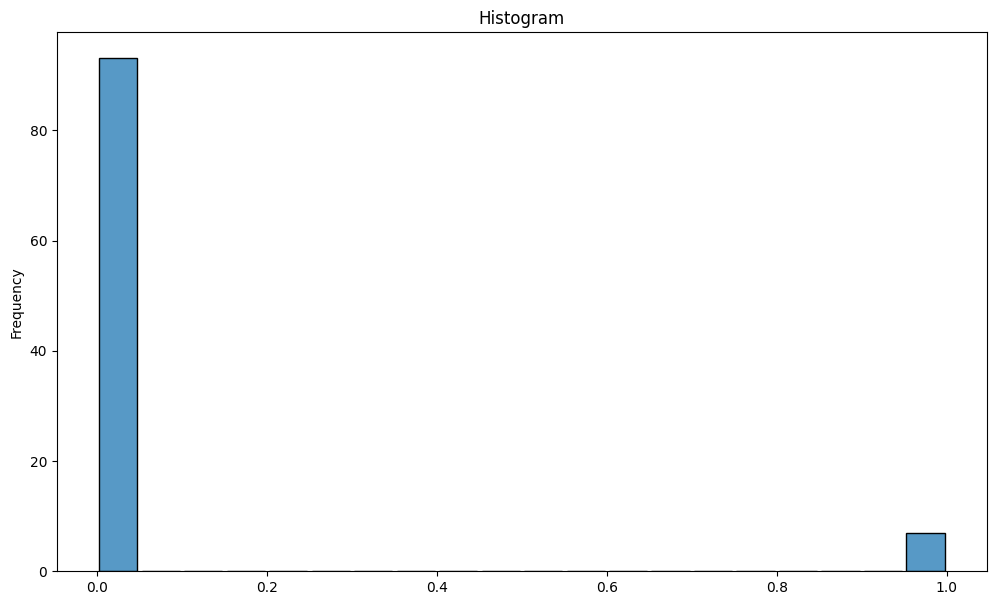

key


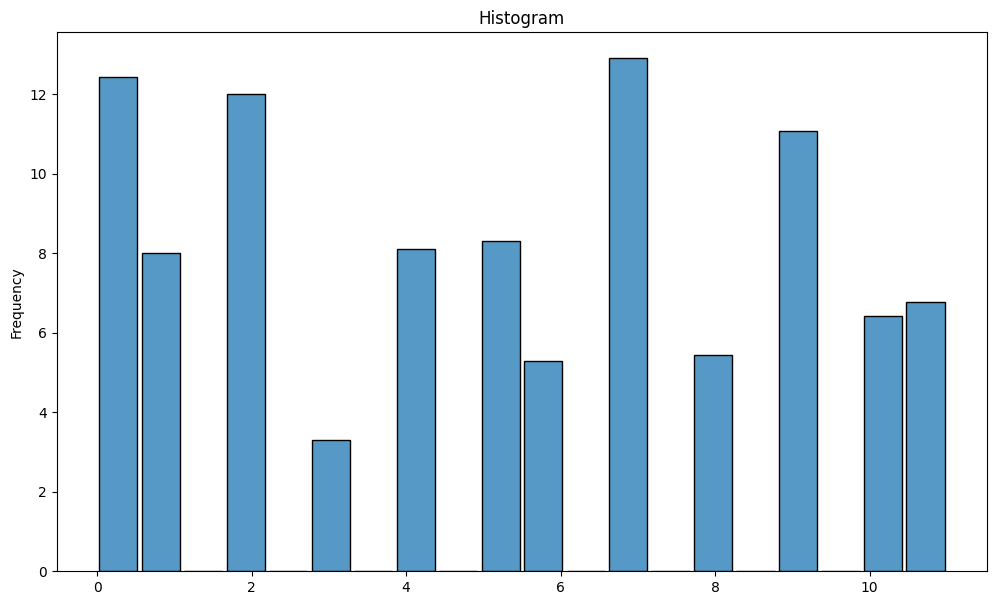

mode


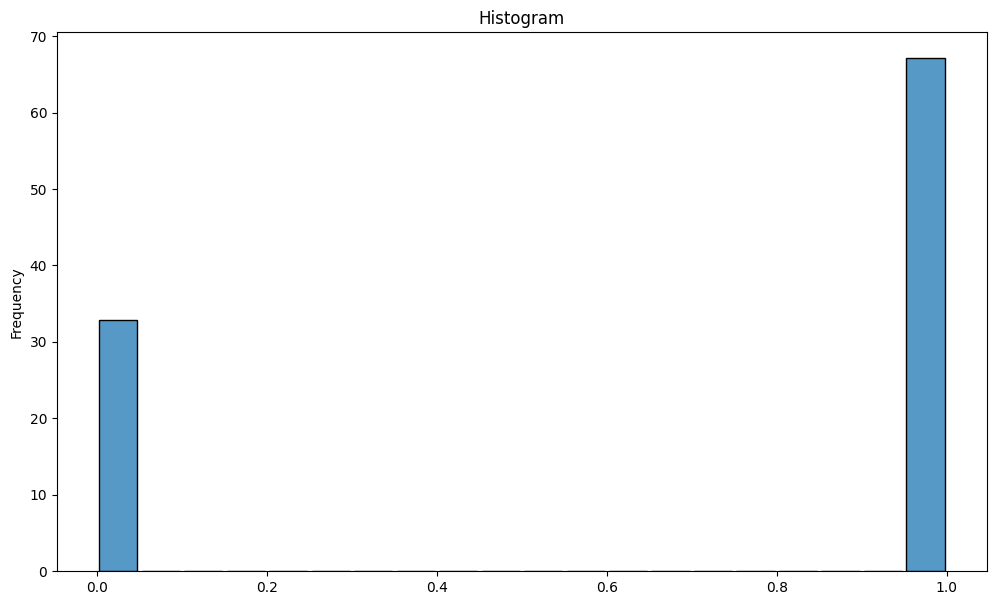

time_signature


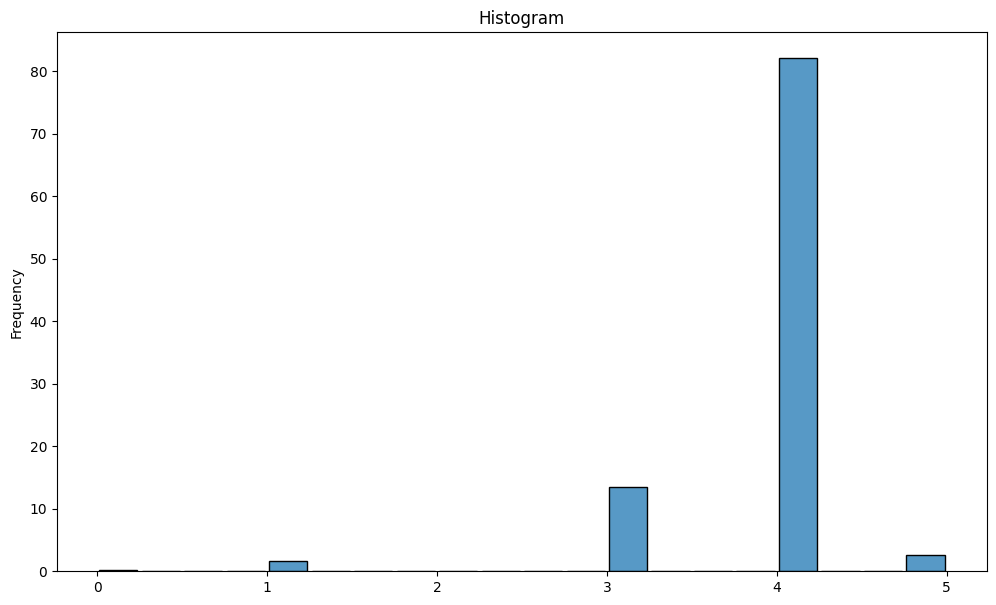

year


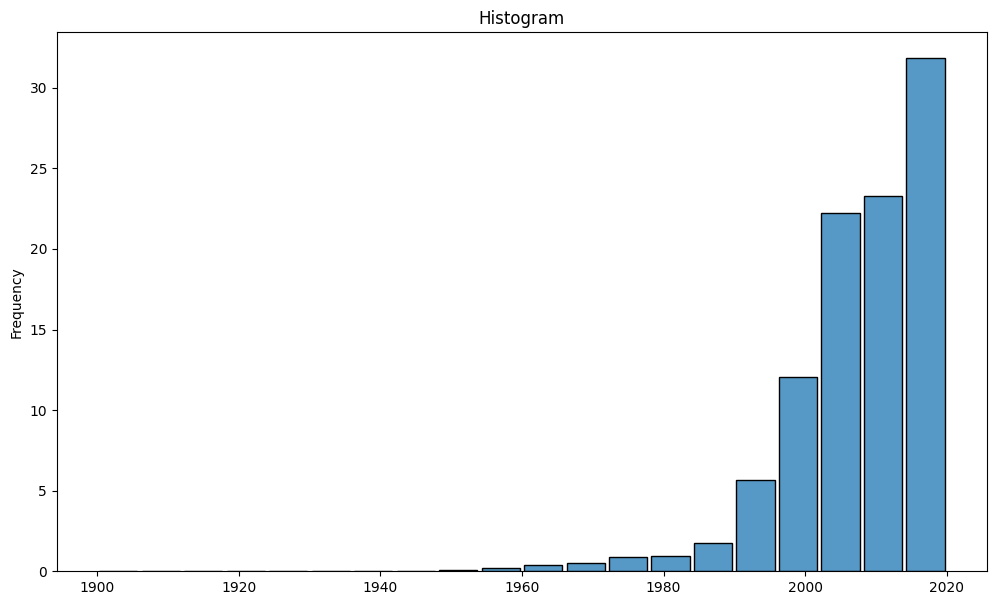

month


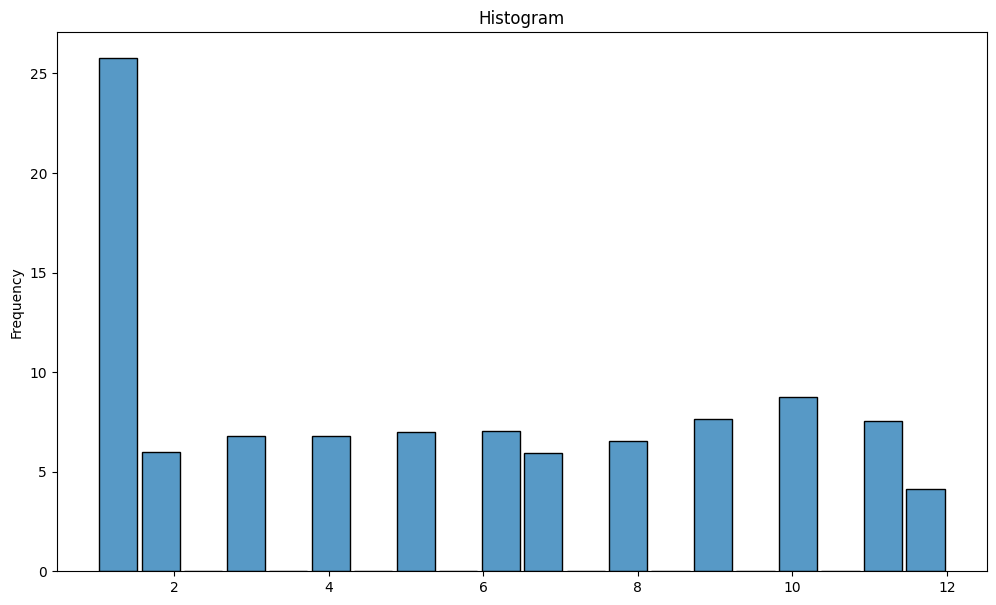

day


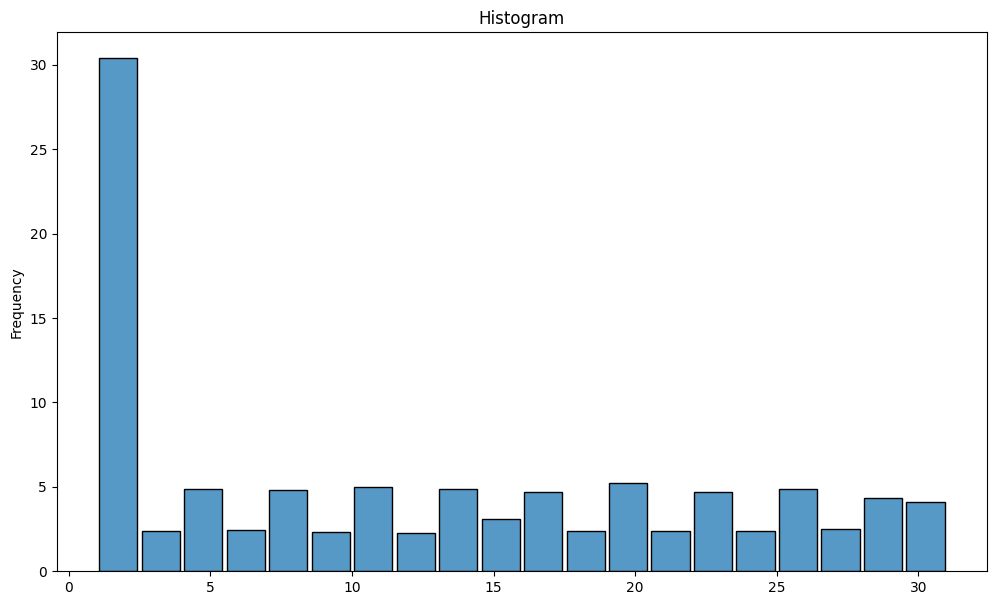

day_of_week


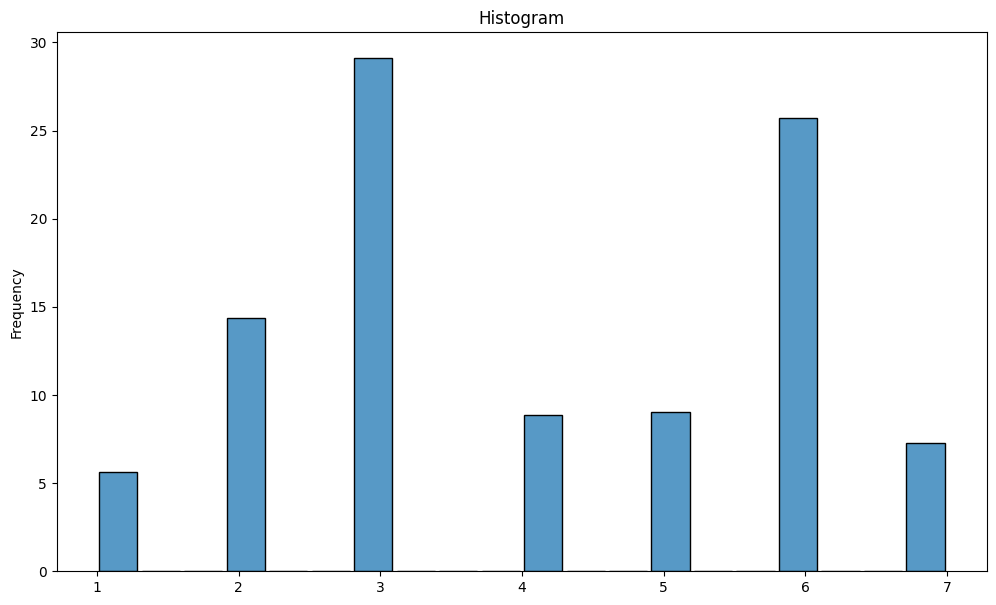

duration_min


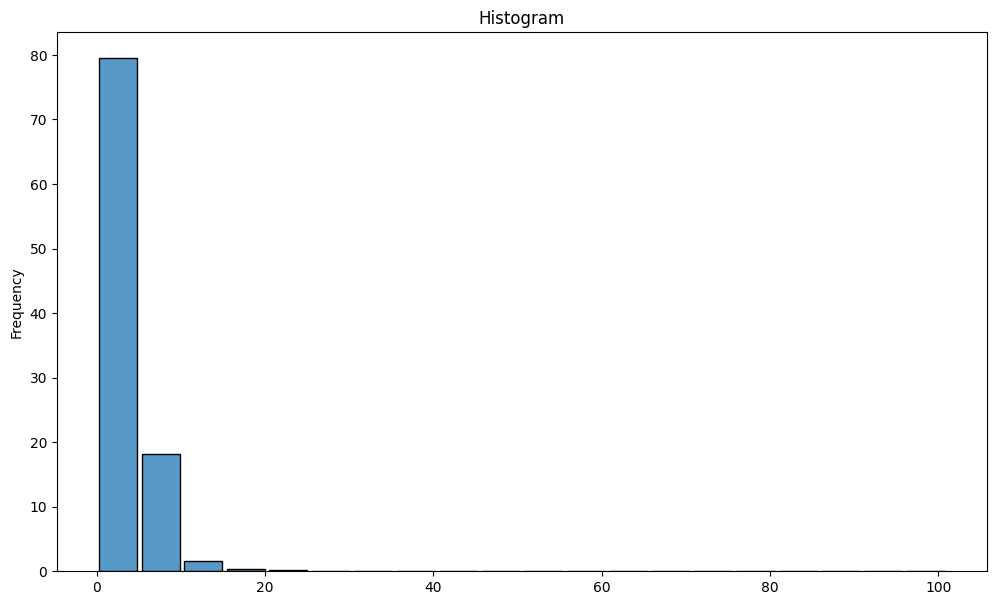

In [ ]:
def plot_histogram(column_data):
    plt.figure(figsize=(12, 7))
    sea.histplot(column_data, stat='percent', bins=20, shrink=0.9)
    plt.ylabel('Frequency')
    plt.title(f'Histogram')
    plt.show()

for col in forHistPlot:
    print(col)
    column_data = getElements(data, col)
    plot_histogram(column_data)


### 3.1 Detayled Histogram
- After plotting histogram, we notice there are few number of tracks before 1960.
- Also most of songs' duration is less than 20 minutes.

so we draw more detayled histogram:

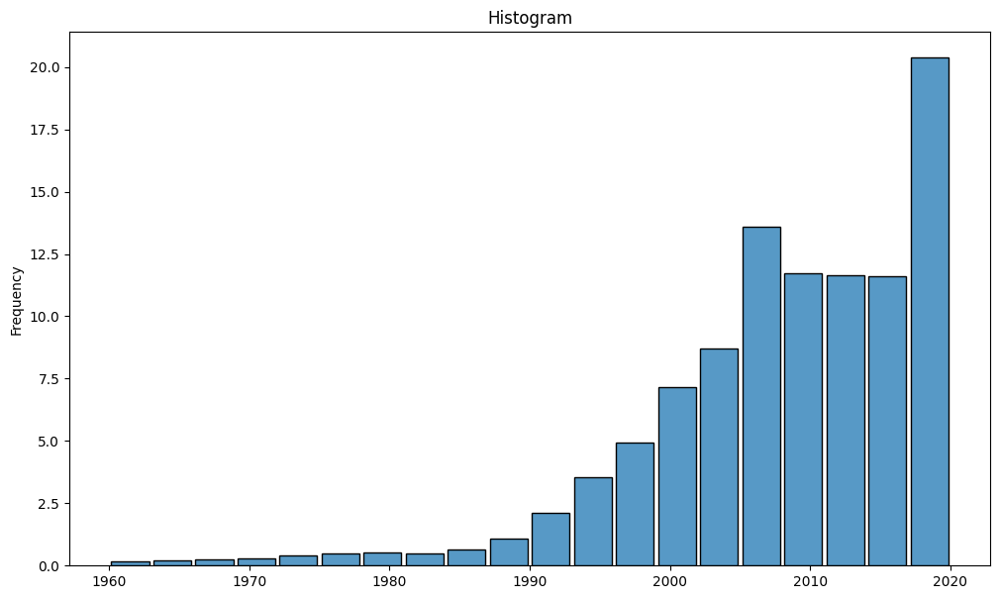

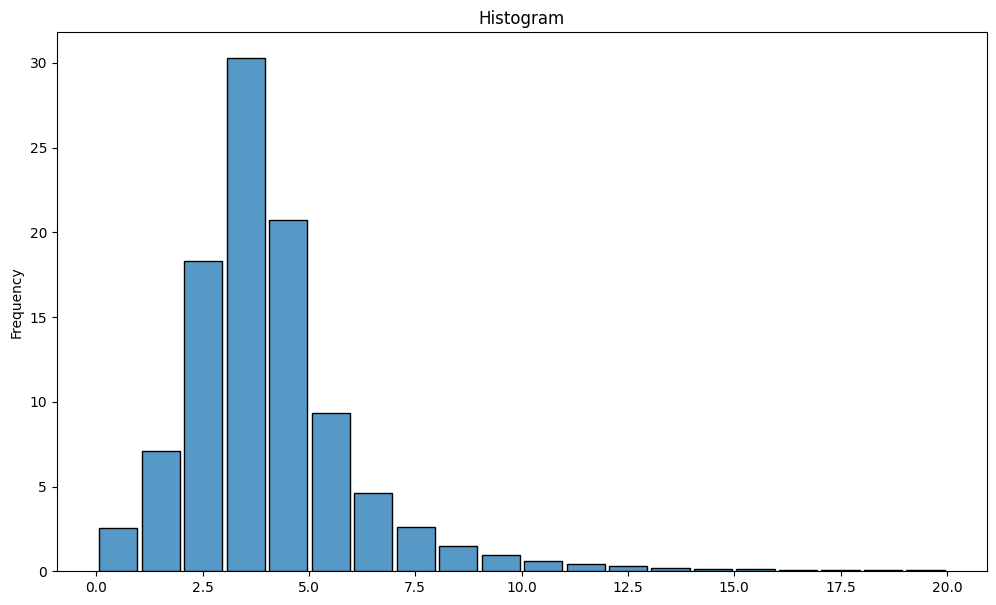

In [ ]:
dataforYear = data.filter(data['year'] >= 1960)
dataforDuration = data.filter(data['duration_min'] < 20)
plot_histogram(getElements(dataforYear, 'year'))
plot_histogram(getElements(dataforDuration, 'duration_min'))

## 4. Density and Distribution of Numerical Featuers

danceability


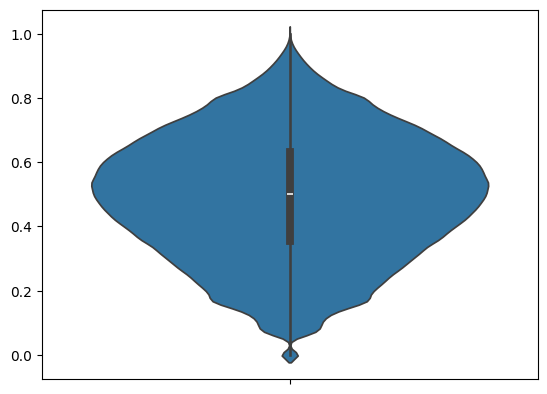

energy


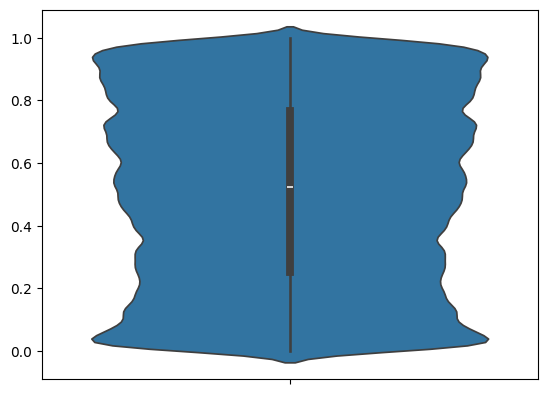

speechiness


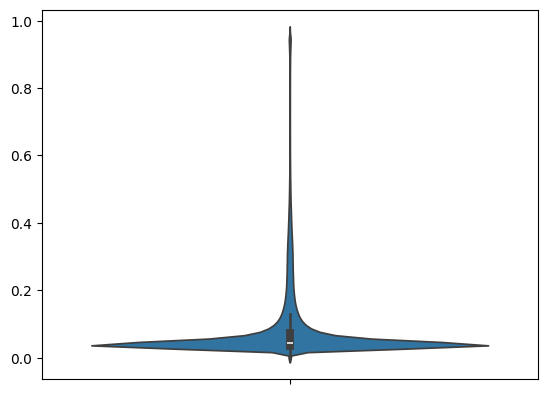

acousticness


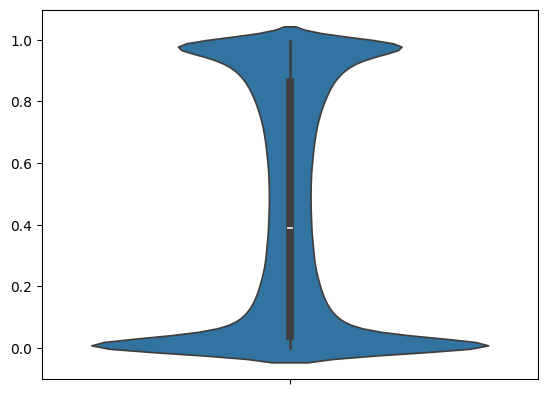

instrumentalness


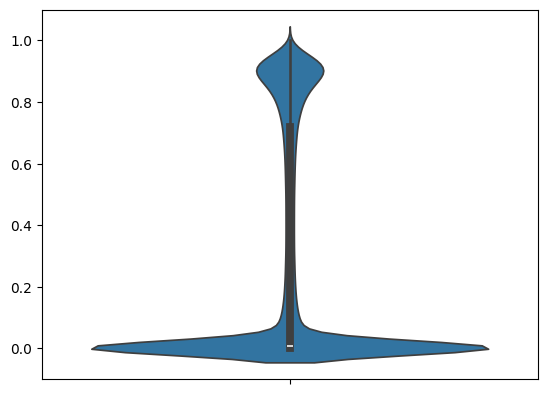

liveness


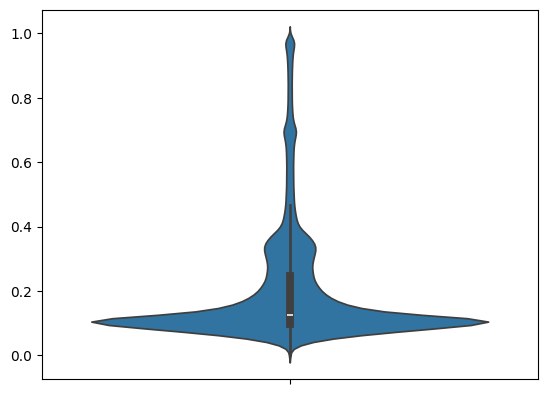

valence


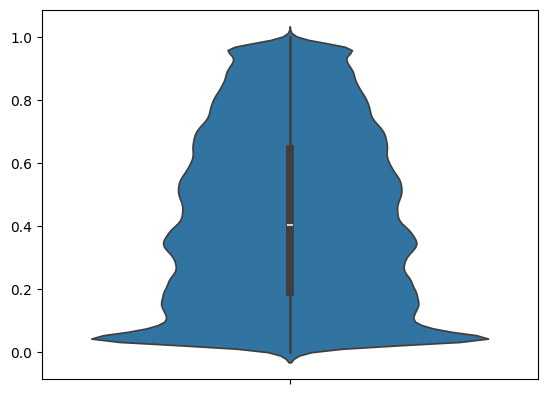

tempo


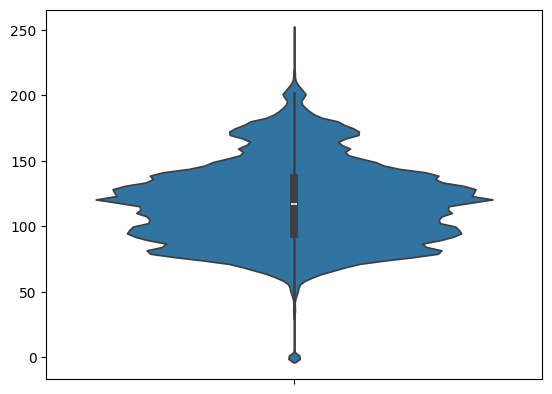

In [ ]:
for col in forViolinPlot:
    print(col)
    column_data = getElements(data, col)
    sea.violinplot(column_data)
    plt.show()


## 5. Average of Features Through Years



- Dancibility: falls a lot in 1930s during WW2, butit is incresing after 2000.
- Energy: has a raise in 1960-1980 but a fall in 1980-1990 and it is increasing after 1990.
- loudness: has a big fall in 1980-90 but after that it is highly increasing.
- speechiness: It is increasing slowly in the last decade.
- Acousticness: It was falling all the time except 1980-90.
- Valence: It has a serious decrease in 1930s(probably for WW2) and it has a small fall after 2000(maybe depression!)
- Month and Day: Average month and day number of releasing musics is increasing, wierd!
- Duration: The duration of songs is decreasing lately.

- There is a significant disorder during 1930s and 1980-90.

let see explain some reasons for observed changes in 1980-90:
1. Evolution of genres: The 1980s and 1990s witnessed the rise of new music genres such as grunge, alternative rock, and hip-hop, which often featured different musical characteristics compared to the dominant genres of previous decades. These emerging genres might have prioritized different aspects of music production, leading to lower energy and valence levels in some cases.

2. Artistic experimentation: During this period, many artists and musicians sought to push boundaries and explore new artistic directions. This experimentation often involved incorporating more introspective or subdued elements into their music, which could contribute to the decrease in energy and valence.

3. Cultural shifts: The 1980s and 1990s were marked by significant cultural changes. The music of these decades often reflected the social and political climate of the time, which was characterized by a sense of disillusionment, introspection, and a departure from the high-energy, optimistic tones of previous eras.

4. Technological advancements: The advancements in music production technology during this period allowed for greater control over sound and introduced new possibilities in music creation. These technological developments might have influenced the production choices made by musicians and producers, leading to changes in energy and valence levels.

- and in 1930s:
1. The Great Depression: The 1930s saw the world grappling with the Great Depression, an economic crisis that originated in the United States but had far-reaching global consequences. The stock market crash of 1929 triggered a severe economic downturn, leading to widespread unemployment, poverty, and social unrest in many countries. The economic hardship experienced during this time created a sense of disorder and uncertainty.

2. Political Instability: The 1930s also witnessed a rise in political instability and the emergence of authoritarian regimes. In Europe, Adolf Hitler and the Nazi Party came to power in Germany, ushering in a period of intense nationalism and later leading to World War II. Similarly, other countries, such as Italy under Benito Mussolini and Spain under Francisco Franco, experienced the rise of fascist regimes. These political shifts and the accompanying ideologies contributed to the disorder and conflicts of the era.

In [ ]:
data.filter(data['year'] < 1960).count()

4836

In [ ]:
dataforYear = data.filter(data['year'] >= 1960)

danceability


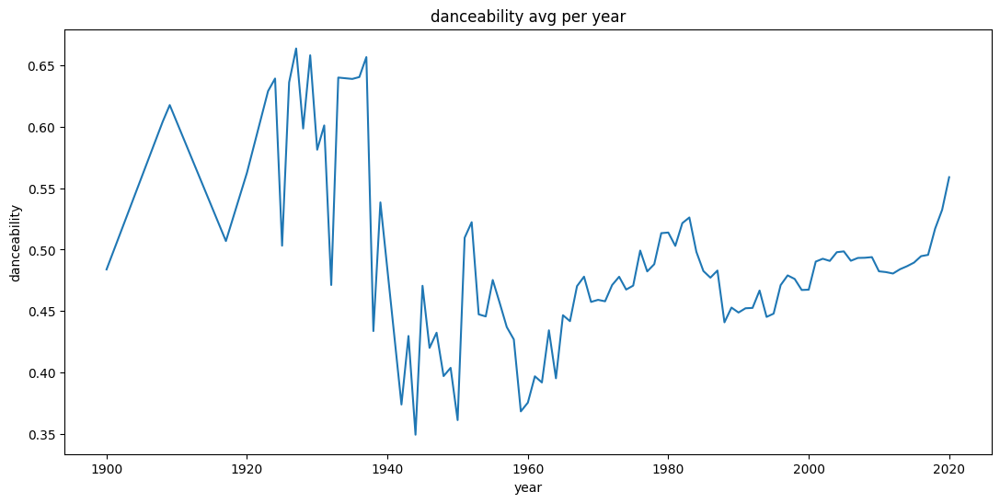

energy


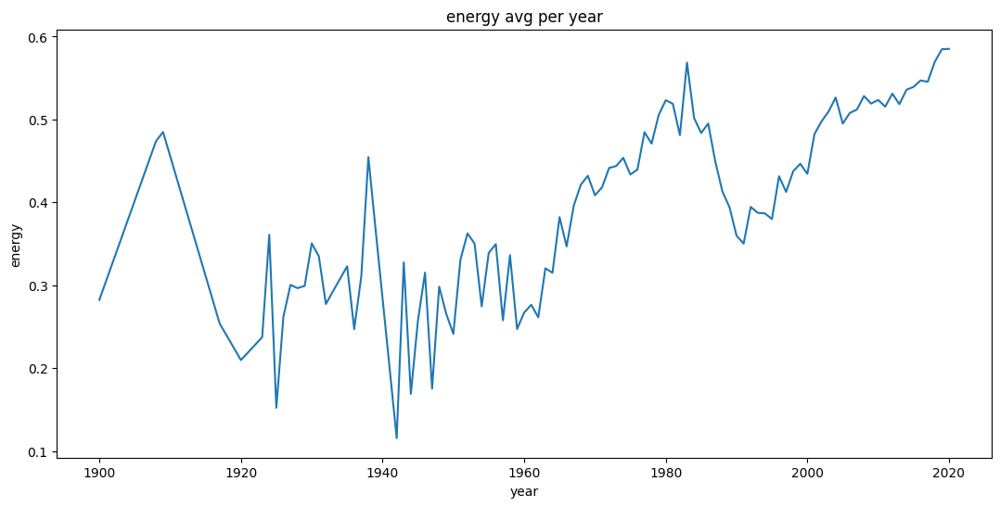

key


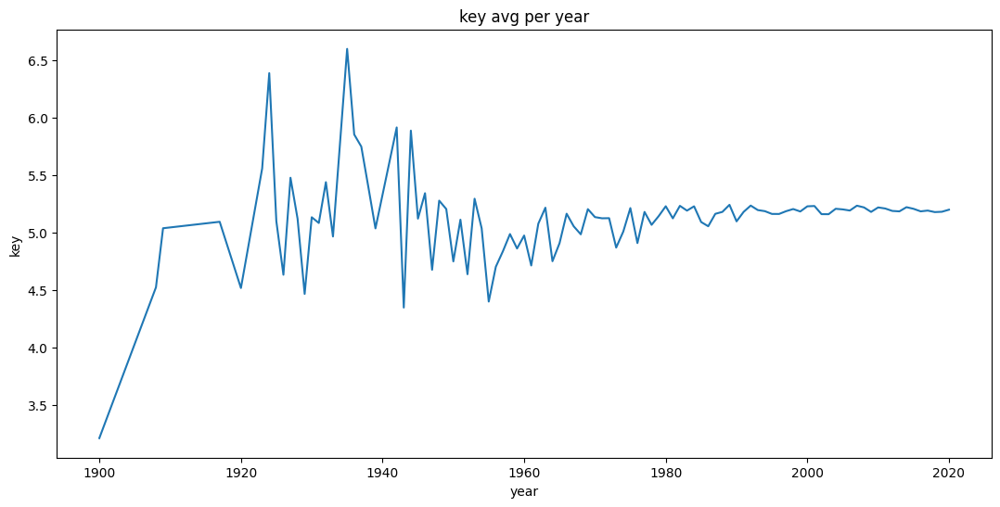

loudness


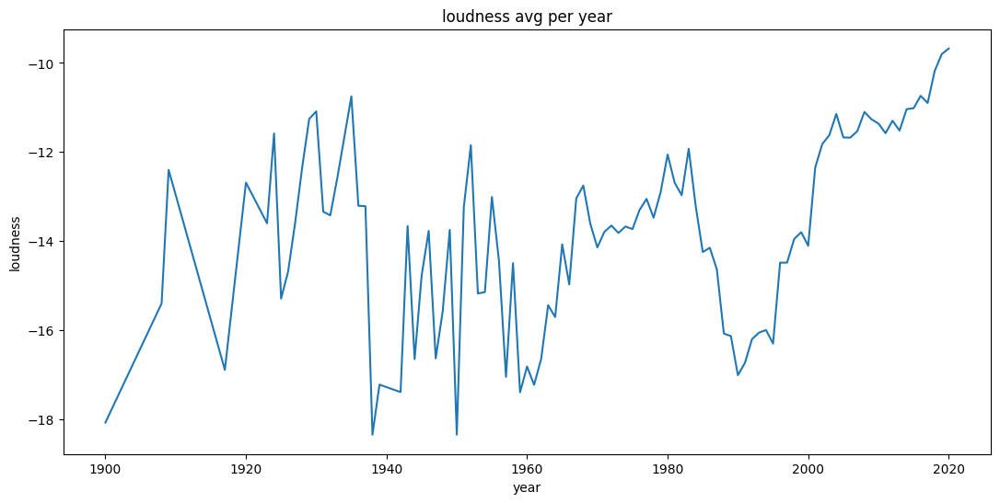

mode


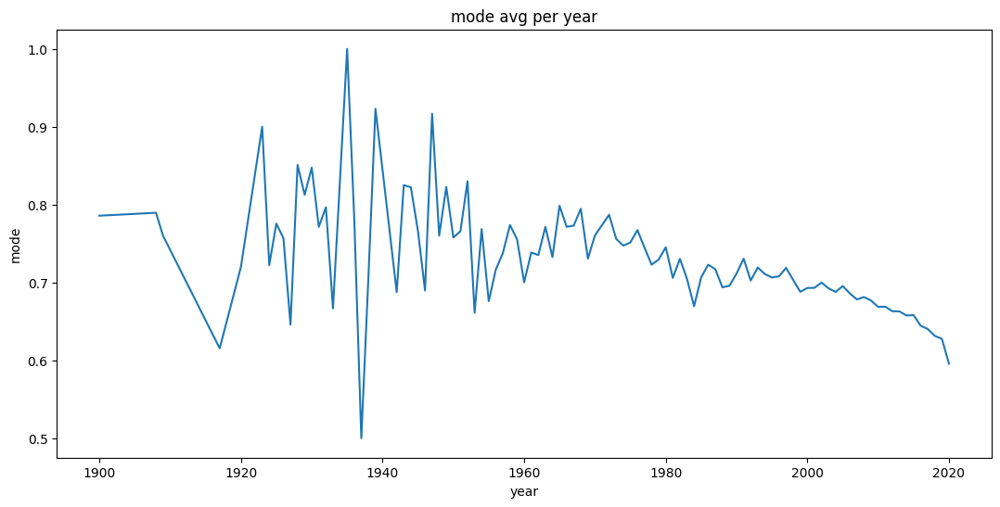

speechiness


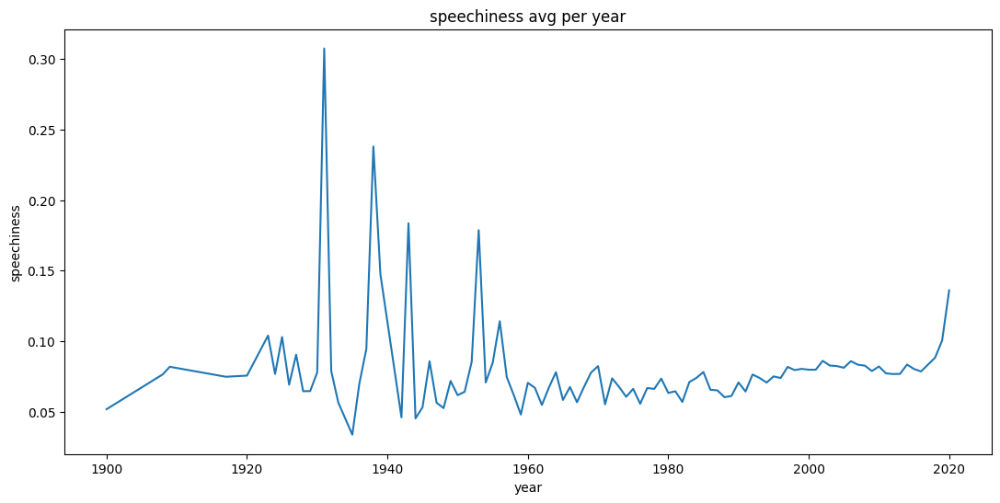

acousticness


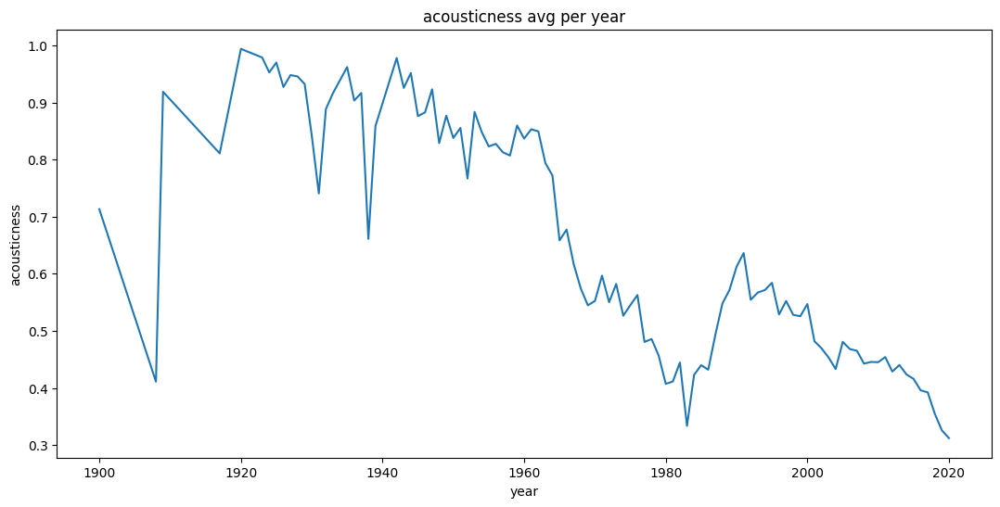

instrumentalness


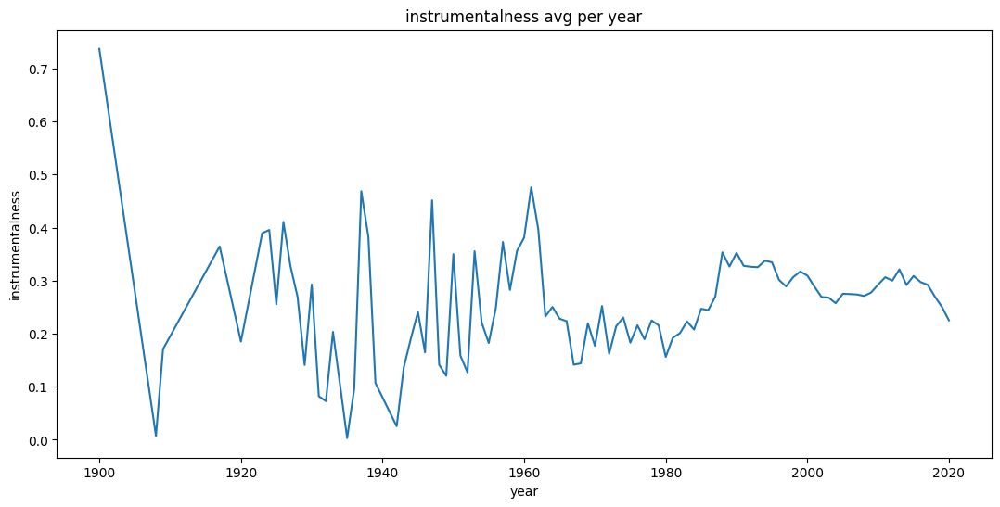

liveness


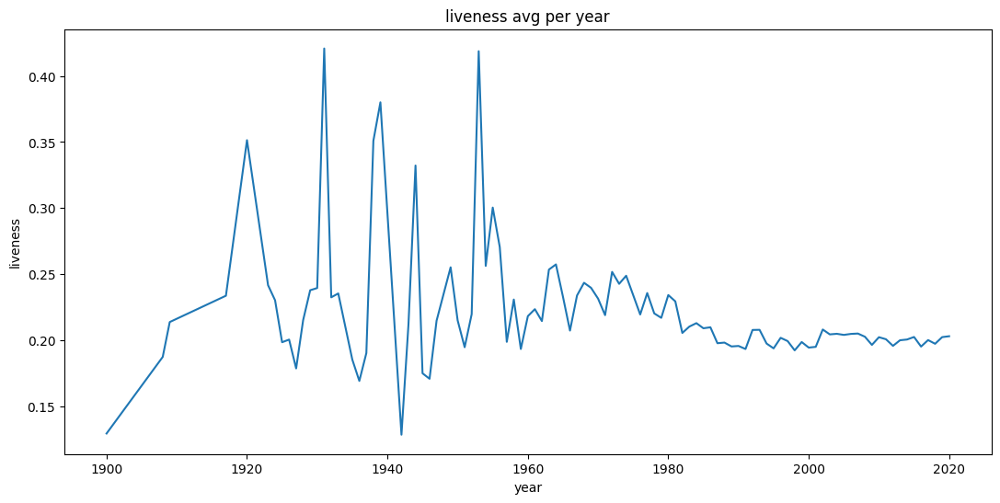

valence


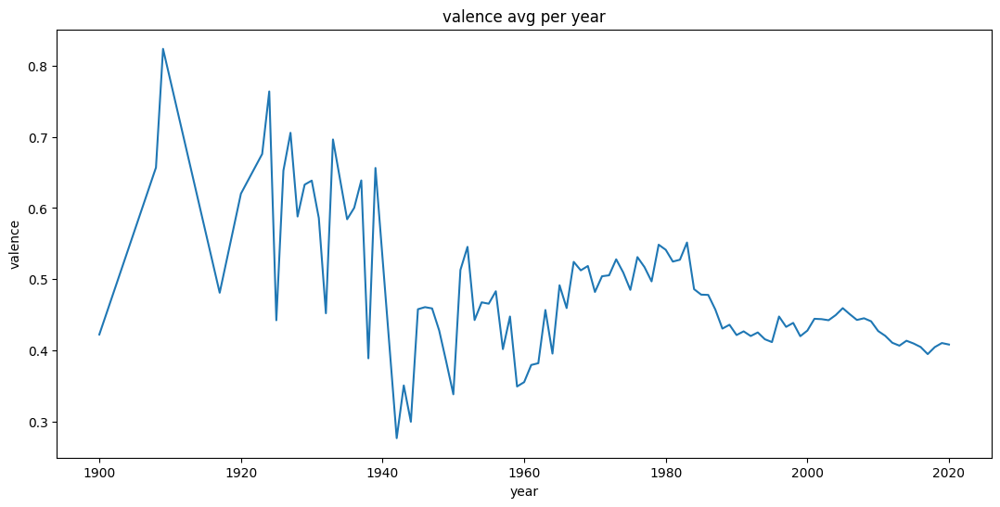

tempo


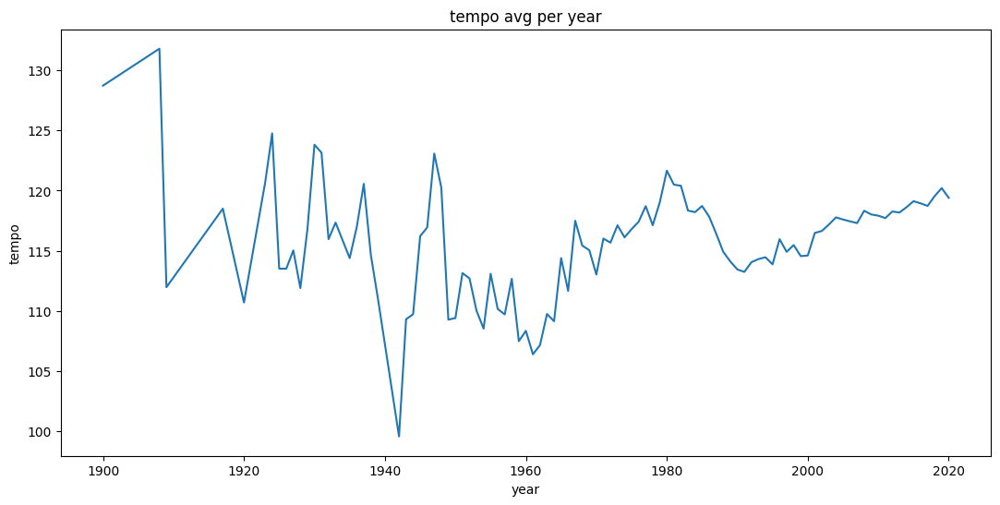

time_signature


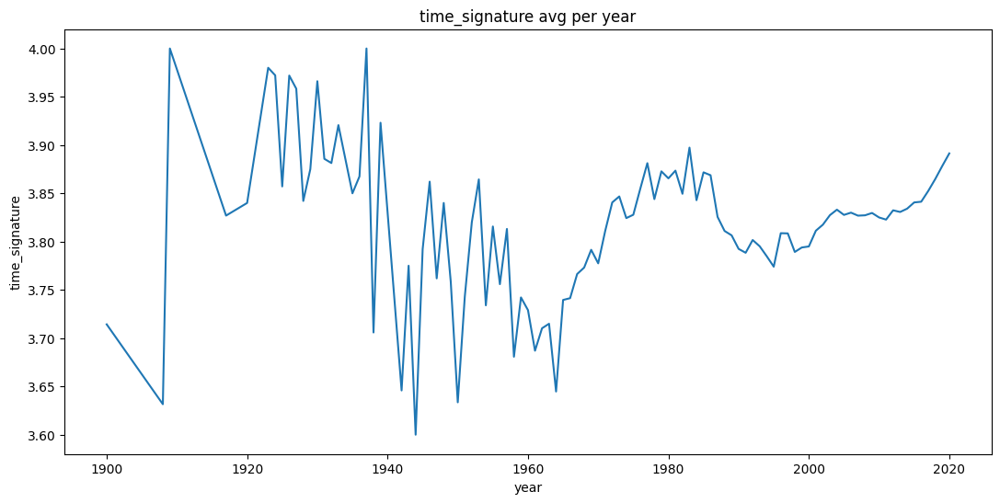

month


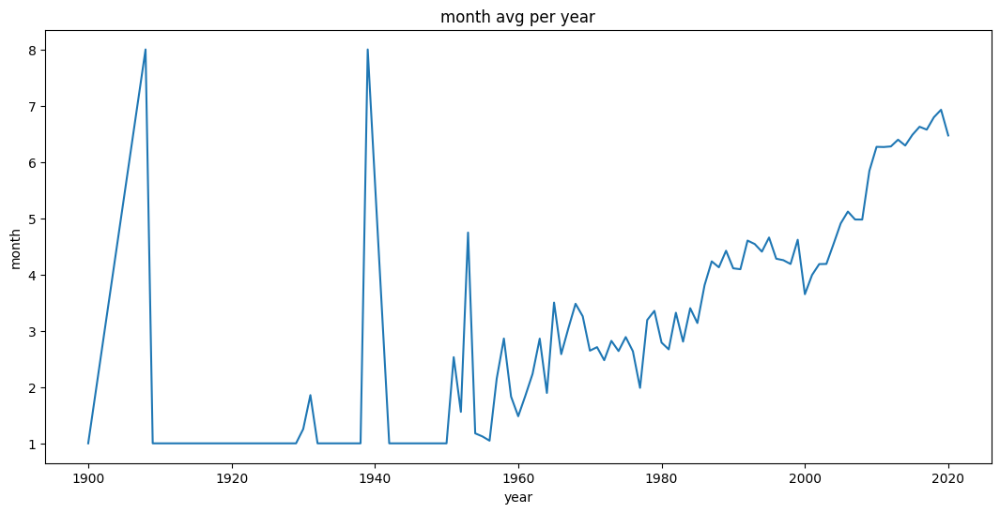

day


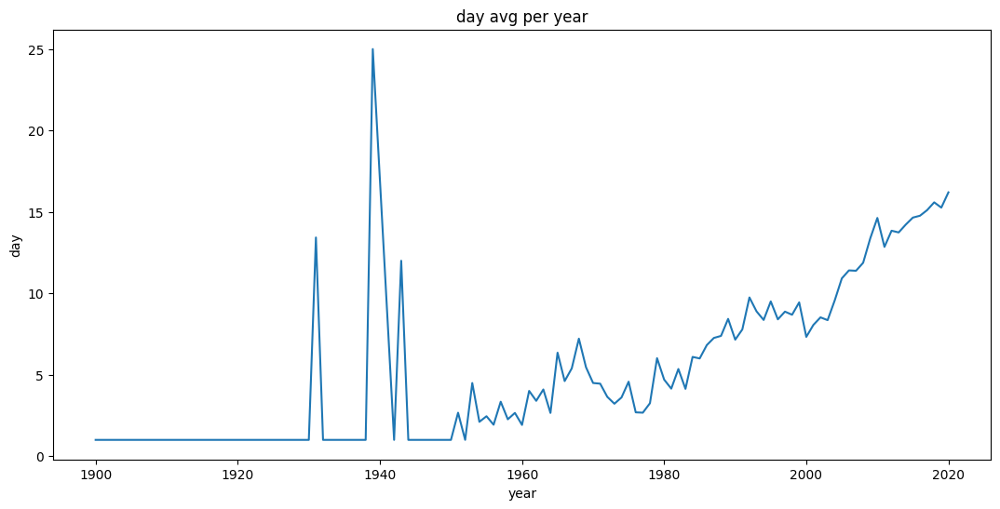

day_of_week


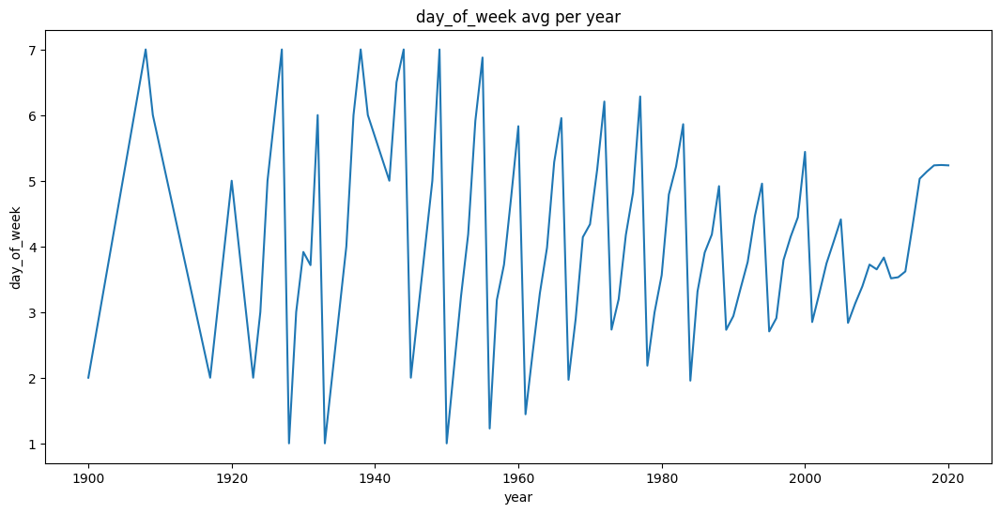

duration_min


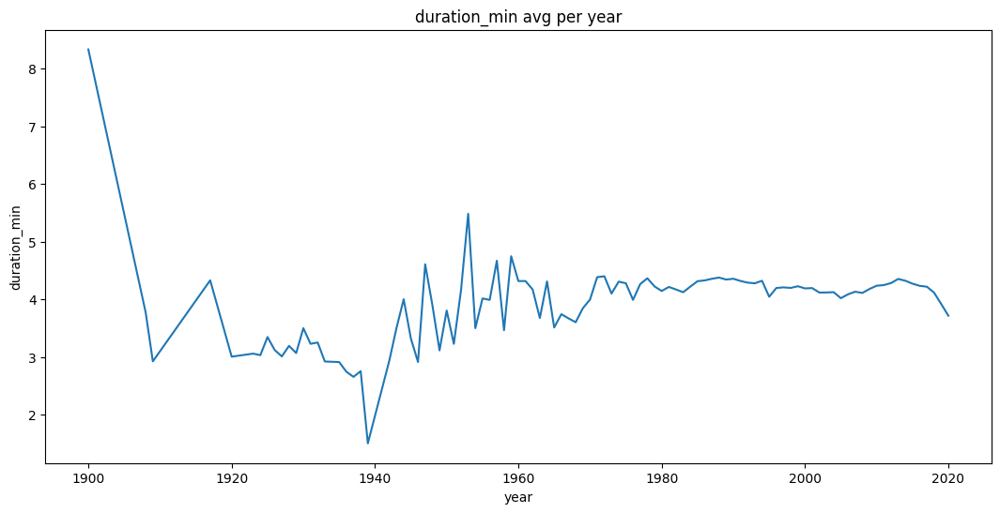

In [ ]:
year_column = 'year'
mean_data = data.groupBy(year_column).mean()
mean_data = mean_data.orderBy(year_column)
years = mean_data.select(year_column).rdd.flatMap(lambda x: x).collect()
mean_data
for column in mean_data.columns:
    if(column[4:-1] in forYearPlot):
        plt.figure(figsize=(13, 6))

        print(column[4:-1])
        values = getElements(mean_data, column)
        plt.plot(years, values)
        plt.xlabel('year')
        plt.ylabel(column[4:-1])
        plt.title(f'{column[4:-1]} avg per year')
        plt.show()

## 6. Tracks' Release Dates: Months

In [ ]:
def plot_bar(x, y, title):
    plt.figure(figsize=(7, 5))
    plt.bar(x, y, color='skyblue')
    plt.title(title)
    plt.show()

def plot_pie(x, labels, title, startangle=120):
    plt.figure(figsize=(6, 7))
    plt.pie(x, labels=labels, autopct='%1.1f%%', counterclock=False, startangle=startangle)
    plt.axis('equal')
    plt.title(title, fontsize=12)
    plt.show()

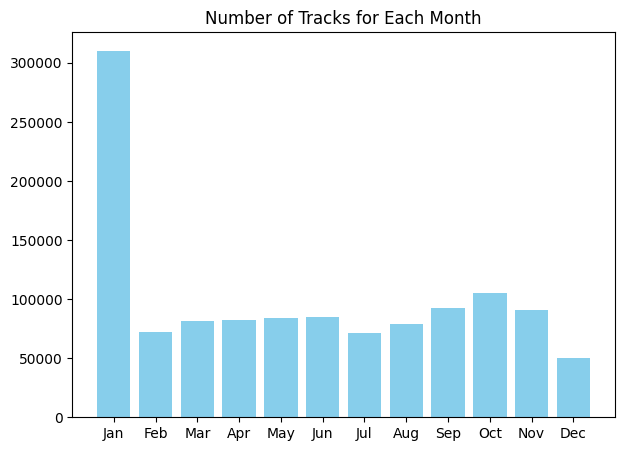

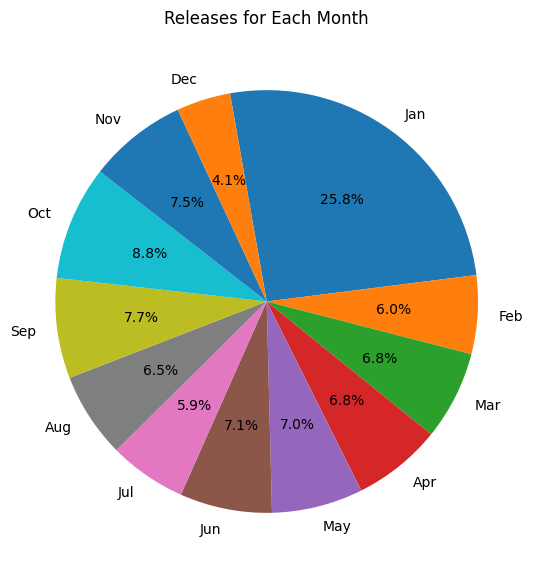

In [ ]:
monthNames = ["Jan", "Feb", "Mar", "Apr", "May", "Jun", "Jul", "Aug", "Sep", "Oct", "Nov", "Dec"]
monthsCount = data.groupBy('month').count().orderBy('month')
counts = getElements(monthsCount, 'count')

plot_bar(monthNames, counts, 'Number of Tracks for Each Month')
plot_pie(counts, monthNames, 'Releases for Each Month', startangle=100)


The higher percentage of music releases in January could be due to several reasons:

- **Market Saturation**: The market is less saturated in January compared to other times of the year. This gives new releases more visibility and less competition.
- **Post-Holiday Sales**: Releasing music in January can capitalize on post-holiday sales, as people may have received gift cards or money during the holidays.
- **New Year, New Music**: There's an allure of starting the new year with new music. It's a time when listeners are open to discovering new songs and artists.
- **Strategic Planning**: Some releases may coincide with tours, appearances, etc., and the full impact is optimized after the holidays.

<br>

Also Octobor is a peak.
- According to the internet: October falls within the fourth quarter of the calendar year, which is often considered a prime period for the music industry.


## 7. Tracks' Release Dates: Week of the Month

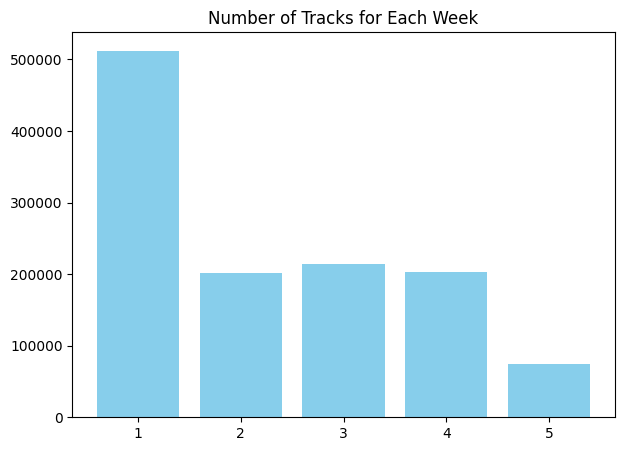

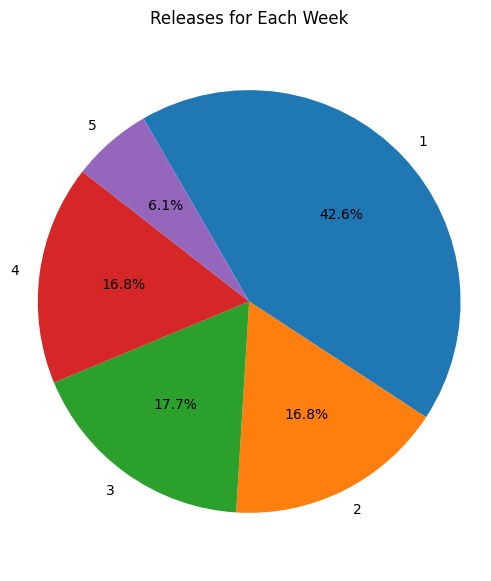

In [ ]:
weekNumData = data.withColumn('week_number', Utils.ceil(data['day'] / 7))

weeklyCounts = weekNumData .groupBy('week_number').agg(Utils.count('*').alias('count')).orderBy('week_number').collect()

weeksNumbers = [row['week_number'] for row in weeklyCounts]
weeksCounts = [row['count'] for row in weeklyCounts]

plot_bar(weeksNumbers, weeksCounts, 'Number of Tracks for Each Week')
plot_pie(weeksCounts, weeksNumbers, 'Releases for Each Week', startangle=120)

The higher percentage of music releases in the first week of the month could be due to several factors:

- **New Month, New Music**: Releasing new music at the start of the month can help set the tone for the rest of the month. It's a time when listeners are open to discovering new songs and artists.

- **Strategic Planning**: Some releases may coincide with the start of the month for promotional purposes. This can help in building momentum for the rest of the month.

- **Chart Calculations**: Many music charts, such as the Billboard charts, operate on a weekly tracking cycle that begins on a specific day, often at the start of the week. Releasing music early in the week increases the chances of accumulating a full week's worth of sales, streams, and radio plays, maximizing the potential for a higher chart position.

## 8. Tracks' Release Date: Day of Week


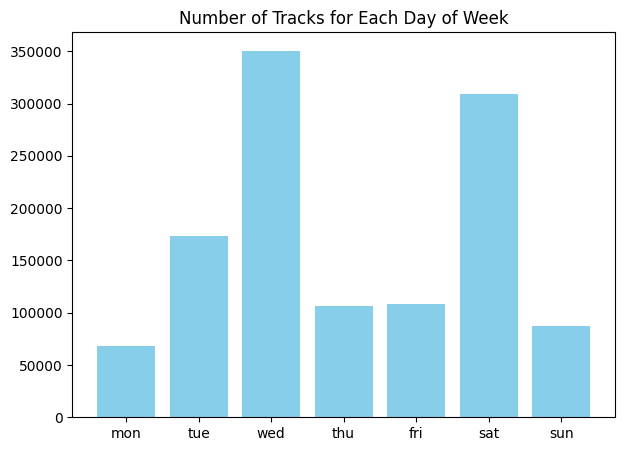

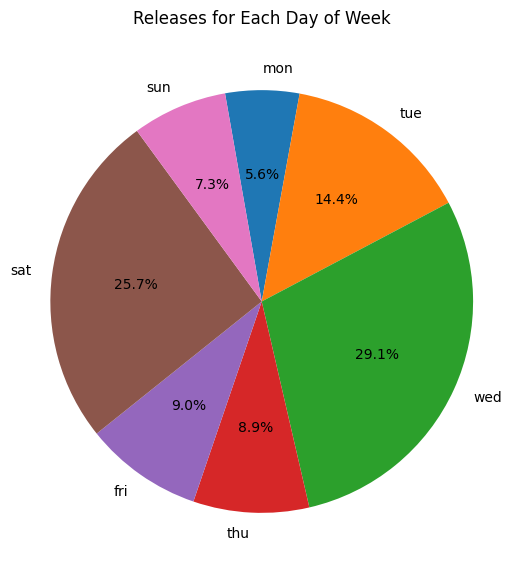

In [ ]:
dayNames = ["mon", "tue", "wed", "thu", "fri", "sat", "sun"]
daysCount = data.groupBy('day_of_week').count().orderBy('day_of_week')
counts = getElements(daysCount, 'count')

plot_bar(dayNames, counts, 'Number of Tracks for Each Day of Week')
plot_pie(counts, dayNames, 'Releases for Each Day of Week', startangle=100)

The higher percentage of music releases on Wednesday and Saturday could be due to several factors:

- **Midweek Visibility**: Releasing on Wednesday might be a strategy to gain midweek visibility when the competition is potentially lower.

- **Consumer Engagement**: Wednesday and Saturday are often considered days when people have more leisure time and are more likely to engage with entertainment content. Releasing music on these days may increase the chances of capturing the attention of listeners who are actively seeking new music or have more time available for music discovery and consumption. This can lead to higher engagement, streaming numbers, and potential exposure within the music community.

- **Industry Standard and Chart Considerations**: In some regions, such as the United States, the official music tracking week for chart purposes typically begins on a Friday and ends on a Thursday. Releasing music on a Wednesday allows for a mid-week release, maximizing the potential for a full week's worth of sales, streams, and radio plays to be counted towards chart performance. This strategy aims to accumulate as many units as possible within the chart tracking period.

- **Strategic Planning**: Some artists might align their releases with specific events or promotional activities happening on these days.

## 9. Monthly Average

In [ ]:
def plot_mean_by_month(col):
    global monthNames
    global data
    monthlyMeanData = data \
        .groupBy('month') \
        .agg(Utils.mean(col).alias('mean_value')) \
        .orderBy('month') \
        .collect()

    months = [row['month'] for row in monthlyMeanData]
    mean_values = [row['mean_value'] for row in monthlyMeanData]

    plt.figure(figsize=(12, 5))
    plt.plot(months, mean_values, linewidth=1.3)
    plt.grid(visible=True, axis='both')
    plt.ylabel('Mean ' + col.capitalize())
    plt.title('Mean ' + col.capitalize() + ' for Each Month')
    plt.xticks(range(1, 13), monthNames)
    plt.show()

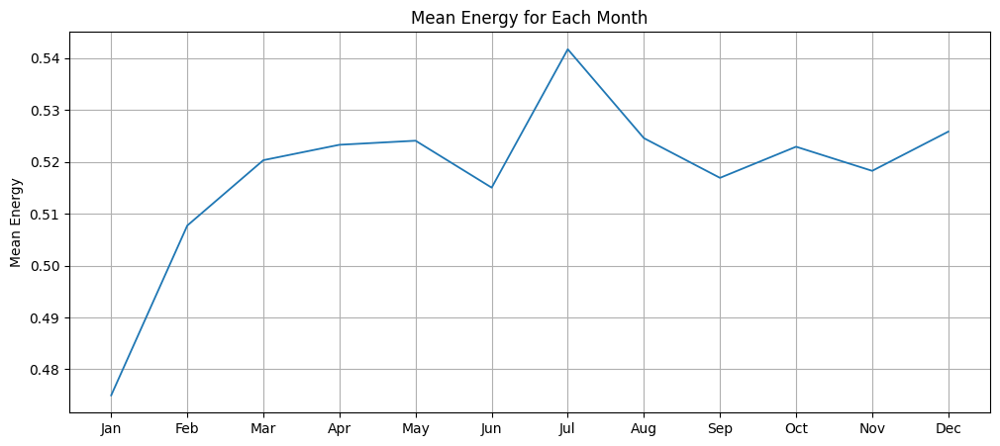

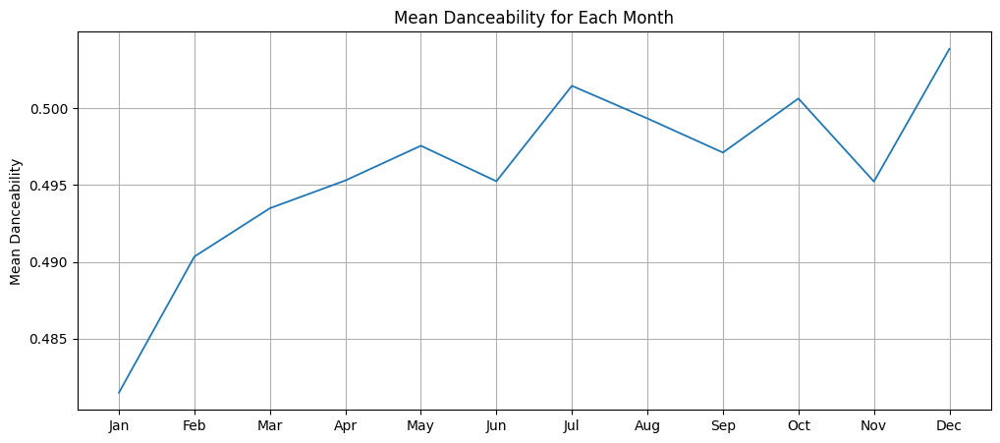

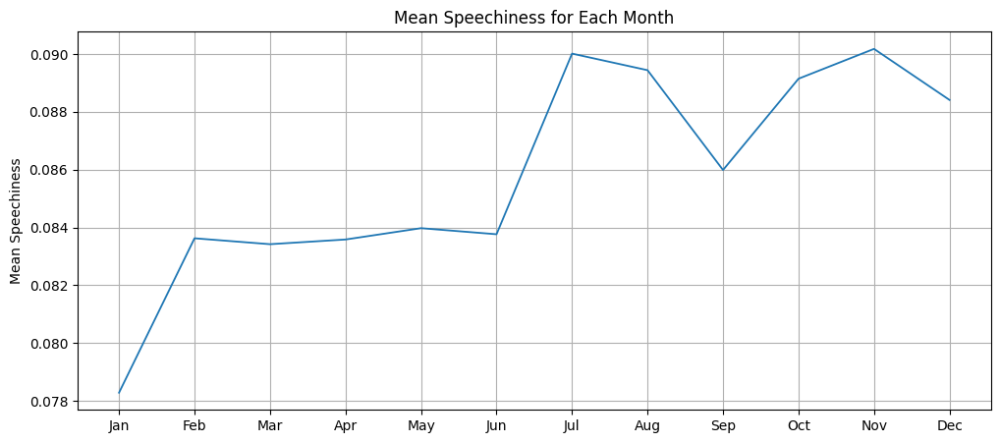

In [ ]:
plot_mean_by_month('energy')
plot_mean_by_month('danceability')
plot_mean_by_month('speechiness')

The trends in the dataset could be influenced by several factors:

- **Seasonal Trends**: Music listening habits can change with the seasons. Energy, speechiness, and danceability might increase towards the summer months (July-August) as people often prefer more upbeat and energetic music during this time. Also this happens again in the end of the year (Dec), as it get close to the Christmas holiday. 
- **Music Releases**: Artists might release more energetic and danceable music during the summer to coincide with festivals and live events.
- **Listener Mood**: Listener mood can also influence music preference. People might prefer more energetic and danceable music when they are in a positive mood, which can often be the case during the summer months.

- **Cultural Events**: Certain months might have more cultural events or holidays that influence the type of music being released or listened to.
- **Marketing Strategies**: Record labels and artists often follow specific marketing strategies for releasing their tracks. They might choose to release tracks with higher energy, speechiness, and danceability during certain months to align with listener's preferences.


### Add Decade Feature
We add a decade feature for further analysis.

In [ ]:
data = data.withColumn("decade", Utils.floor(data["year"] / 10) * 10)

## 10. Correlation Between Some Features

In [ ]:
colsToCorr = [
    'energy',
    'loudness',
    'danceability',
    'speechiness',
    'acousticness',
    'instrumentalness',
    'liveness',
    'valence',
]


In [ ]:
corrMatrix = []
calcedCorrs = {}

for i in range(len(colsToCorr)):
    row = []
    for j in range(len(colsToCorr)):
        if i == j:
            corrValue = 1
        elif (i, j) in calcedCorrs:
            corrValue = calcedCorrs[(i, j)]
        else:
            corrValue = data.select(Utils.corr(colsToCorr[i], colsToCorr[j])).collect()[0][0]
            calcedCorrs[(i, j)] = corrValue
            calcedCorrs[(j, i)] = corrValue
        row.append(corrValue)
    corrMatrix.append(row)

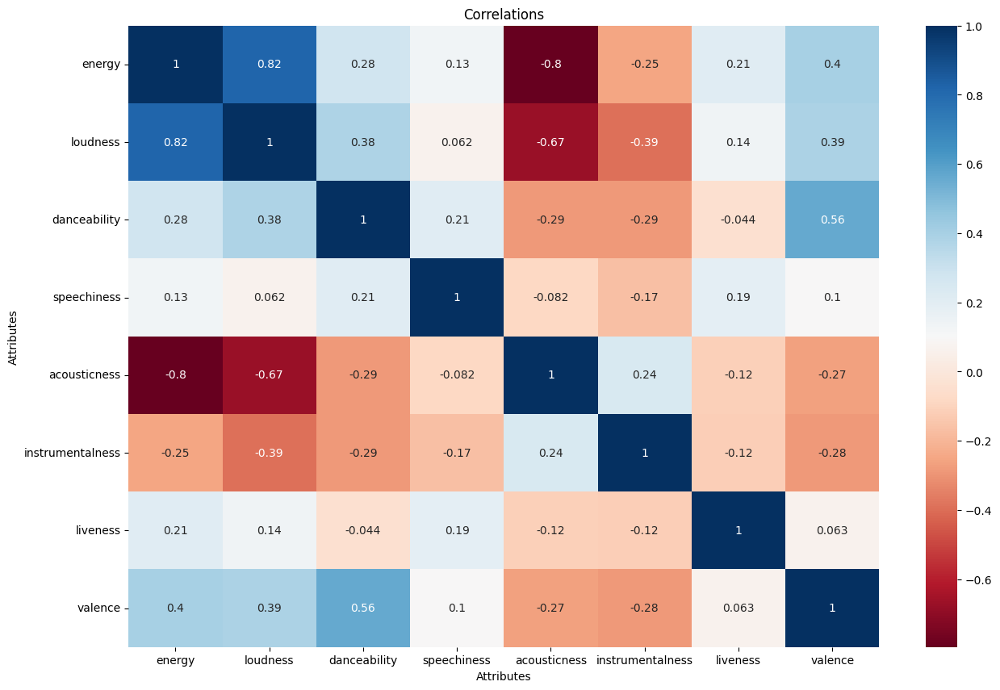

In [ ]:
plt.figure(figsize=(15, 10))
cmap = diverging_palette(220, 220, as_cmap=True)
sns.heatmap(corrMatrix, annot=True, cmap='RdBu', xticklabels=colsToCorr, yticklabels=colsToCorr)
plt.title('Correlations')
plt.xlabel('Attributes')
plt.ylabel('Attributes')
plt.show()

We can observe some relations between features with this scatter plot:

1. **Loudness and Energy**: Loudness and energy in a song are often positively correlated. This is because both of these features represent the intensity and power of a song. 

    - **Loudness** is a measure of the overall volume of a song, measured in decibels (dB). It's a perceptual measure that can vary depending on the overall mix of the track.
    
    - **Energy**, on the other hand, represents a perceptual measure of intensity and activity. Typically, energetic tracks feel fast, loud, and noisy. For example, death metal has high energy, while a Bach prelude scores low on the scale.

    So, it's natural that songs that are loud also tend to be energetic, leading to a high positive correlation between loudness and energy.


2. **Acousticness and Energy**: Acousticness and energy in a song are often negatively correlated.

    - **Acousticness** is a measure of whether a song is acoustic. A high score indicates a high likelihood of the song being acoustic.
    
    - As mentioned earlier, **Energy** represents a perceptual measure of intensity and activity. 

    So, a song that is acoustic is often less intense and less noisy, leading to a lower energy score.


3. **Acousticness and Loudness**: A ~60 percent negative correlation between acousticness and loudness suggests that louder songs in the dataset are likely to be less acoustic. This makes sense as acoustic tracks are often quieter, featuring more natural sounds, while louder tracks might be more electronic or heavily produced.


4. **Danceability and Valence**: A ~56 percent positive correlation between danceability and valence suggests that tracks that are more danceable are moderately likely to have a higher valence. Valence is a measure of musical positiveness in a track. So, tracks that are more danceable are often more positive, which aligns with the idea that people generally dance to more upbeat and happy music.


5. **Speechiness and Loudness**: There's a less than 1 percent positive correlation between speechiness and loudness and it suggests that there's almost no linear relationship between these two features in our dataset. The low correlation indicates that the presence of spoken words in a track has little to do with the overall loudness of the track. It's possible to have tracks that are very talkative but not necessarily loud, and vice versa. This is why the correlation between speechiness and loudness is not strong in the dataset.

## 11. Top Artist of Each Decade Based on Tracks' number

In [ ]:
dataWithArtists = data.withColumn("artist", Utils.explode(Utils.split(Utils.regexp_replace(data["artists"], "[\[\]]", ""), ", ")))

artistCountByDecade = dataWithArtists.groupBy("decade", "artist").agg(Utils.count("id").alias("trackCount"))

topArtistByDecade = artistCountByDecade \
    .groupBy("decade") \
    .agg(Utils.max(Utils.struct("trackCount", "artist")).alias("topArtistInfo")) \
    .select("decade", "topArtistInfo.artist", "topArtistInfo.trackCount")

totalTracksByDecade = data.groupBy("decade").agg(Utils.count("*").alias("totalTracks"))

portionTracksByTopArtist = totalTracksByDecade \
    .join(topArtistByDecade, "decade") \
    .withColumn("portion",Utils.concat(Utils.format_number(topArtistByDecade["trackCount"] / totalTracksByDecade["totalTracks"] * 100, 2)
                .cast("double"), Utils.lit(" %"))) \
    .select(
        "decade", "artist", "trackCount", "portion"
    )


portionTracksByTopArtist.show(truncate=False)

+------+-----------------------+----------+-------+
|decade|artist                 |trackCount|portion|
+------+-----------------------+----------+-------+
|1900  |'Rabih Abou-Khalil'    |14        |24.14 %|
|1910  |'Igor Stravinsky'      |3         |5.77 % |
|1920  |'Bix Beiderbecke'      |56        |12.15 %|
|1930  |'Billie Holiday'       |51        |11.26 %|
|1940  |'Doris Day'            |63        |9.65 % |
|1950  |'Leonard Bernstein'    |343       |10.86 %|
|1960  |'New York Philharmonic'|467       |5.32 % |
|1970  |'Dolly Parton'         |311       |1.81 % |
|1980  |'Neeme Järvi'          |352       |1.23 % |
|1990  |'Johann Sebastian Bach'|1845      |1.21 % |
|2000  |'Johann Sebastian Bach'|3877      |0.91 % |
|2010  |'Johann Sebastian Bach'|2978      |0.6 %  |
|2020  |'Ludwig van Beethoven' |1126      |1.62 % |
+------+-----------------------+----------+-------+



In [ ]:

artistCountByYear = dataWithArtists.groupBy("year", "artist").agg(Utils.count("id").alias("trackCount"))

topArtistByYear = artistCountByYear \
    .groupBy("year") \
    .agg(Utils.max(Utils.struct("trackCount", "artist")).alias("topArtistInfo")) \
    .select("year", "topArtistInfo.artist", "topArtistInfo.trackCount")

totalTracksByYear = dataforYear.groupBy("year").agg(Utils.count("*").alias("totalTracks"))

portionTracksByTopArtist = totalTracksByYear\
    .join(topArtistByYear, "year") \
    .withColumn("portion",Utils.concat(Utils.format_number(topArtistByYear["trackCount"] / totalTracksByYear["totalTracks"] * 100, 2)
                .cast("double"), Utils.lit(" %"))) \
    .select(
        "year", "artist", "trackCount", "portion"
    )


portionTracksByTopArtist.show(portionTracksByTopArtist.count(), truncate=False)

+----+-----------------------------------+----------+-------+
|year|artist                             |trackCount|portion|
+----+-----------------------------------+----------+-------+
|1960|'New York Philharmonic'            |133       |18.29 %|
|1961|'Leonard Bernstein'                |70        |11.24 %|
|1962|'Johann Sebastian Bach'            |93        |11.05 %|
|1963|'Bob Dylan'                        |60        |6.63 % |
|1964|'Leonard Bernstein'                |61        |8.37 % |
|1965|'Bob Dylan'                        |89        |9.54 % |
|1966|'Bob Dylan'                        |57        |6.12 % |
|1967|'Bob Dylan'                        |72        |7.86 % |
|1968|'The Byrds'                        |52        |5.59 % |
|1969|'Fleetwood Mac'                    |51        |4.09 % |
|1970|'Van Morrison'                     |81        |7.3 %  |
|1971|'Ludwig van Beethoven'             |74        |6.16 % |
|1972|'Aretha Franklin'                  |69        |3.56 % |
|1973|'E

## 12. Tracks' Key

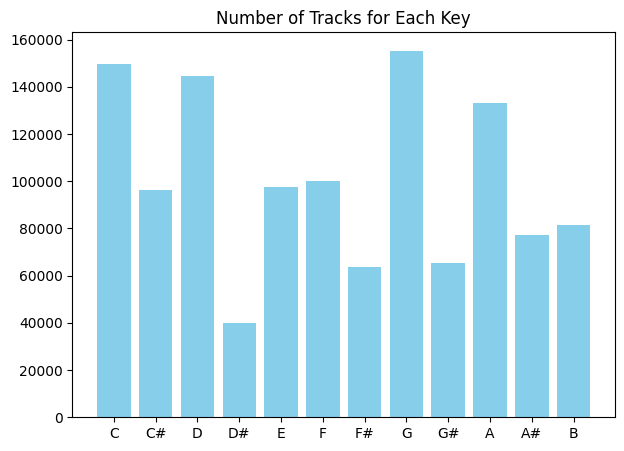

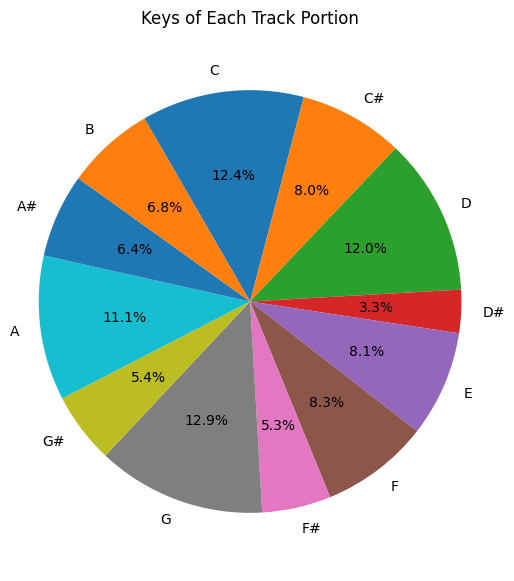

In [ ]:
keyNames = ['C', 'C#', 'D', 'D#', 'E', 'F', 'F#', 'G', 'G#', 'A', 'A#', 'B']
keysCount = data.groupBy('key').count().orderBy('key')
counts = getElements(keysCount, 'count')

plot_bar(keyNames, counts, 'Number of Tracks for Each Key')
plot_pie(counts, keyNames, 'Keys of Each Track Portion')

The distribution of keys in our Spotify dataset could be influenced by several factors:

- **Ease of Play**: Some keys are easier to play on certain instruments. For example, the keys of C, G, D, and A are often easier to play on instruments like the piano and guitar. This could lead to more songs being written in these keys.

- **Sound Preference**: Certain keys might be preferred because they produce a particular sound or mood that's desirable for the song. For example, the key of C is often associated with a 'happy' sound, which might be more prevalent in popular music.

- **Vocal Range**: The key of a song can be chosen to accommodate the vocal range of the singer. Some keys might be more comfortable for a wider range of singers.

These factors could contribute to why the keys of C, D, G, and A are more prevalent compared to D# and F#.

## 13. Tracks' Time Signature

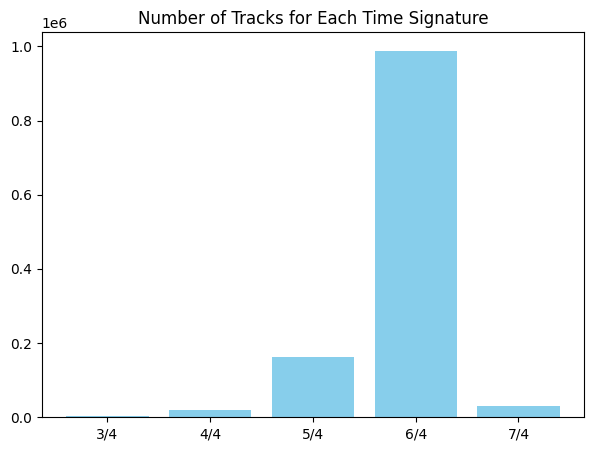

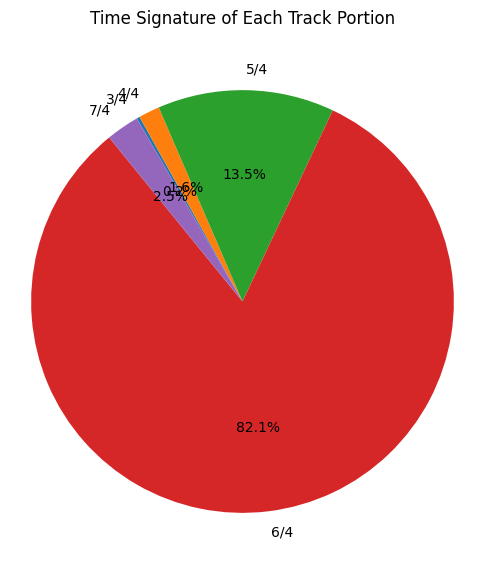

In [ ]:
timeSignNames = ['3/4', '4/4', '5/4', '6/4', '7/4']
signCounts = data.groupBy('time_signature').count().orderBy('time_signature')
counts = getElements(signCounts, 'count')

plot_bar(timeSignNames, counts, 'Number of Tracks for Each Time Signature')
plot_pie(counts, timeSignNames, 'Time Signature of Each Track Portion')

The distribution of time signatures could be influenced by several factors:

- **Musical Tradition**: Certain time signatures are more common in certain genres of music. For example, 4/4 time, also known as common time, is prevalent in pop, rock, and classical music. In the dataset, it appears that 6/4 and 5/4 are the most common, which could suggest a prevalence of certain musical styles or genres where these time signatures are common.

- **Rhythmic Feel**: The time signature of a song contributes to its overall rhythmic feel. A 6/4 time signature gives a song a certain rhythmic pattern that might be desirable for the mood or style of the song. Similarly, a 5/4 time signature creates a unique rhythmic feel that can make a song stand out.

- **Musical Complexity**: Time signatures can also be a measure of musical complexity. More complex time signatures like 5/4 might be less common because they can be more challenging to perform and might not be as accessible to the average listener. The 6/4 time signature, with its six quarter-note beats per measure, might provide a balance of rhythmic interest and compositional flexibility.

- **Musical Characteristics**: The 6/4 time signature is known for its pendulum-like motion, similar to 6/8, but at a slower tempo. This rhythmic pattern might be desirable for the mood or style of many songs.

- **Genre Preferences**: Certain genres might favor the 6/4 time signature. For instance, it's a well-known meter in classical music and has been used many times in popular music.

- **Listener Preference**: Listeners might find the rhythmic feel of 6/4 appealing, leading to a higher demand for songs in this time signature.

## 14. Top-K Tracks

In [ ]:
def top_k_tracks(data, col, k):
    return data.orderBy(col, ascending=False).limit(k).select('name', 'artists', col)

top_k_tracks(data, col='energy', k=5).show(truncate=False)


+---------------------------------------------+---------------------------------+------+
|name                                         |artists                          |energy|
+---------------------------------------------+---------------------------------+------+
|Applause as Lionel Hampton Enters - Live     |['Benny Goodman']                |1.0   |
|Applause (2)                                 |['Audience']                     |1.0   |
|Little Hindu                                 |['Surinder Sandhu']              |1.0   |
|Crack of Doom - Genocide 11/84 Rehearsal Demo|['Repulsion']                    |1.0   |
|Applause                                     |['na Not Applicable', 'Audience']|1.0   |
+---------------------------------------------+---------------------------------+------+



In [ ]:
top_k_tracks(data, col='duration_min', k=5).show(truncate=False)

+-----------------------------------------------------+--------------------------------+------------------+
|name                                                 |artists                         |duration_min      |
+-----------------------------------------------------+--------------------------------+------------------+
|Bargrooves Deluxe Edition 2018 Mix 2 - Continuous Mix|['Various Artists']             |101.01816666666667|
|Doctorow's Third Law                                 |['Wil Wheaton', 'Cory Doctorow']|100.91091666666667|
|Gothic Lolita                                        |['Emilie Autumn']               |96.07706666666667 |
|Bargrooves Deluxe Edition 2017 - Continuous Mix 2    |['Various Artists']             |95.21993333333333 |
|Bargrooves Deluxe Edition 2018 Mix 1 - Continuous Mix|['Various Artists']             |94.65665          |
+-----------------------------------------------------+--------------------------------+------------------+



In [ ]:
top_k_tracks(data, col='loudness', k=5).show(truncate=False)

+--------------+----------------+-----------------+
|name          |artists         |loudness         |
+--------------+----------------+-----------------+
|Bucket        |['Sissy Spacek']|7.234            |
|Mondo Employee|['Sissy Spacek']|7.115            |
|Norge Est     |['Sissy Spacek']|6.98             |
|Devil May Care|['Sissy Spacek']|6.863            |
|(The) Repulse |['Sissy Spacek']|6.797999999999999|
+--------------+----------------+-----------------+



## 15. Top-K Artist

In [ ]:
data.columns

avgArtistFeature = [
    'danceability',
    'energy',
    'loudness',
    'mode',
    'speechiness',
    'acousticness',
    'instrumentalness',
    'liveness',
    'valence',
    'tempo',
    'duration_min',
]

In [ ]:
artistsData = dataWithArtists.groupBy("artist")

def top_k_artist(data, col, k):
    top = data.agg(Utils.mean(col).alias(f'avg {col}')).orderBy(f'avg {col}', ascending=False)
    top.show(k, truncate=False)


### 15.1 Based on Number of Releases

In [ ]:
top = artistsData.count().orderBy(Utils.col("count").desc())
top.show(10, truncate=False)

+--------------------------+-----+
|artist                    |count|
+--------------------------+-----+
|'Johann Sebastian Bach'   |9708 |
|'Ludwig van Beethoven'    |5768 |
|'Wolfgang Amadeus Mozart' |3919 |
|'George Frideric Handel'  |3096 |
|'Antonio Vivaldi'         |2901 |
|'Neeme Järvi'             |2631 |
|'Franz Joseph Haydn'      |2245 |
|'Various Artists'         |2242 |
|'Pyotr Ilyich Tchaikovsky'|2167 |
|'Johannes Brahms'         |2145 |
+--------------------------+-----+
only showing top 10 rows



### 15.2 Based on Other Featurs

In [ ]:
for feature in avgArtistFeature:
    top_k_artist(artistsData, feature, 5)

+--------------------+----------------+
|artist              |avg danceability|
+--------------------+----------------+
|'Andrea HEinstein'  |0.992           |
|'Gen'               |0.987           |
|'Juelz B'           |0.987           |
|'Audio Soul Project'|0.986           |
|'LILDRUGHILL'       |0.984           |
+--------------------+----------------+
only showing top 5 rows

+----------------------------------------+----------+
|artist                                  |avg energy|
+----------------------------------------+----------+
|'CHRIS MASSEY’s forever sharp and vivid'|1.0       |
|'DJ Auzern'                             |1.0       |
|March 14                                |1.0       |
|'Mahavishnu Project'                    |1.0       |
|'Paul Herriot'                          |1.0       |
+----------------------------------------+----------+
only showing top 5 rows

+--------------+------------------+
|artist        |avg loudness      |
+--------------+----------------

## 16. Time To Learn!

In [ ]:
regressionFeatures = [
    'danceability',
    'energy',
    'loudness',
    'speechiness',
    'acousticness',
    'instrumentalness',
    'liveness',
    'valence',
]

elements = []
for col in regressionFeatures:
    elements.append(getElements(data, col))

### 16.1 Regression

In [ ]:
from sklearn.linear_model import LinearRegression
from sklearn.metrics import r2_score, mean_squared_error
import numpy as np

model = LinearRegression()
for i in range(len(regressionFeatures)):
    print(regressionFeatures[i])
    X = np.array(elements[:i] + elements[i+1:]).T
    y = np.array(elements[i]).reshape(-1, 1)
    model.fit(X, y)
    predictions = model.predict(X)
    r2 = r2_score(y, predictions)
    mse = mean_squared_error(y, predictions)
    print("R-squared (R²) score:", r2)
    print("MSE score:", mse)


danceability
R-squared (R²) score: 0.4189983862757257
MSE score: 0.02090096159546019
energy
R-squared (R²) score: 0.8143859031225222
MSE score: 0.016118517809799535
loudness
R-squared (R²) score: 0.7290153726280842
MSE score: 13.210634749590639
speechiness
R-squared (R²) score: 0.1235791799831466
MSE score: 0.011791440714242117
acousticness
R-squared (R²) score: 0.6535411442400945
MSE score: 0.05140747114895895
instrumentalness
R-squared (R²) score: 0.23152374463320335
MSE score: 0.10880814745502647
liveness
R-squared (R²) score: 0.10499199051164321
MSE score: 0.029146245221470517
valence
R-squared (R²) score: 0.41250263089439954
MSE score: 0.0429817379243004


### 16.2 Clustering

In [ ]:
from sklearn.cluster import KMeans

k_values = range(2, 15)
inertia = []

for k in k_values:
    kmeans = KMeans(n_clusters=k, n_init='auto')
    kmeans.fit(np.array(elements).T)
    inertia.append(kmeans.inertia_)


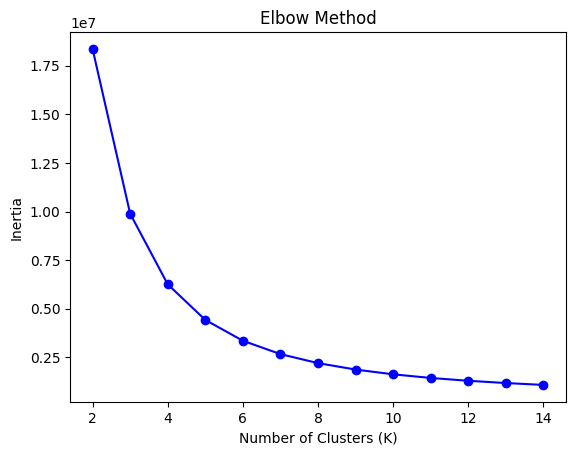

In [ ]:
import matplotlib.pyplot as plt

plt.plot(k_values, inertia, 'bo-')
plt.xlabel('Number of Clusters (K)')
plt.ylabel('Inertia')
plt.title('Elbow Method')
plt.show()

## 17. Relation of Each Pair of Features

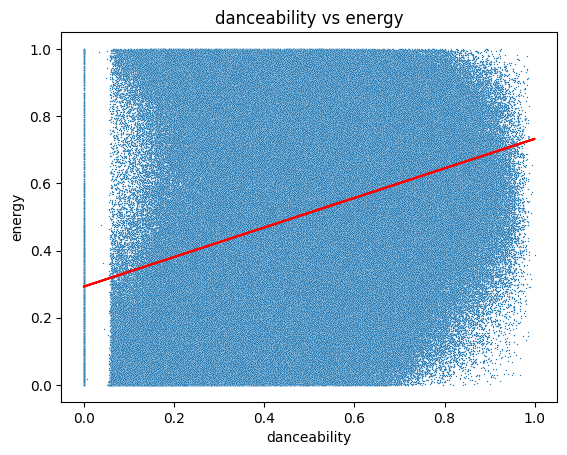

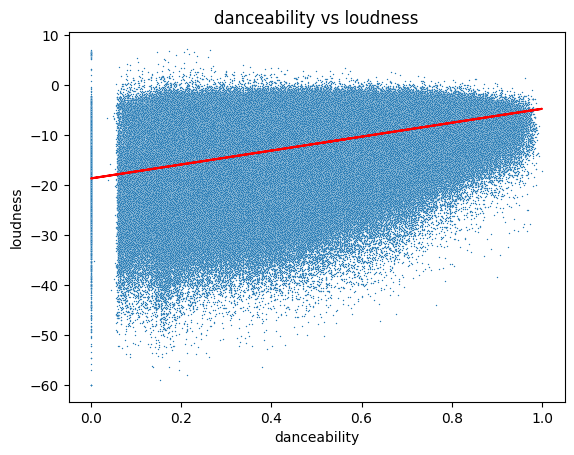

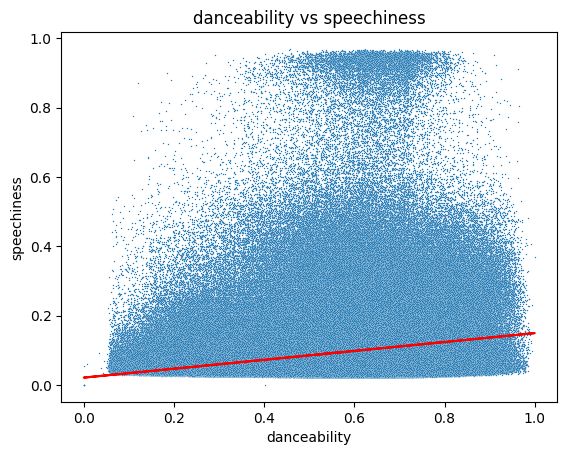

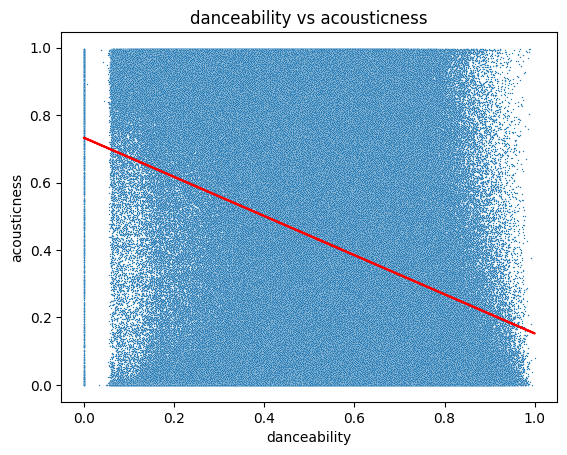

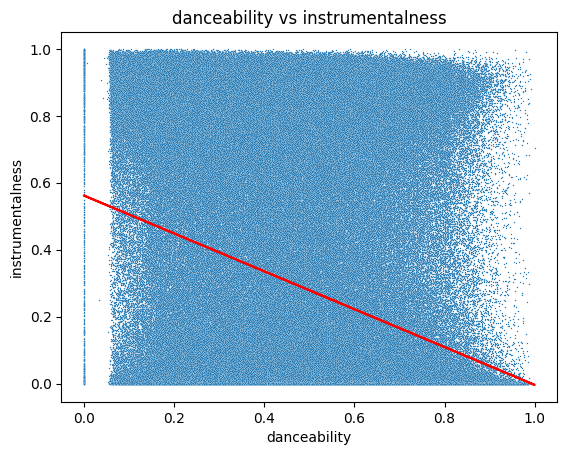

...

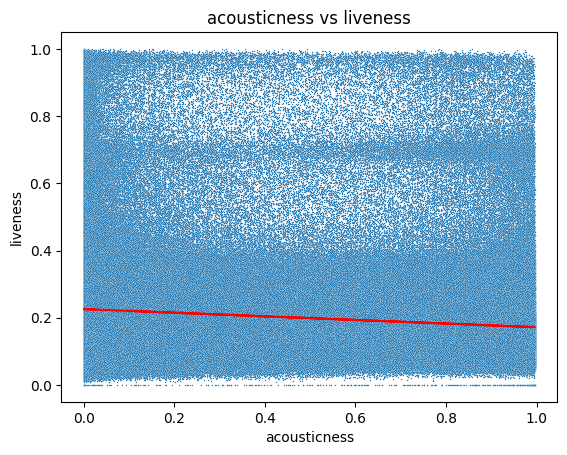

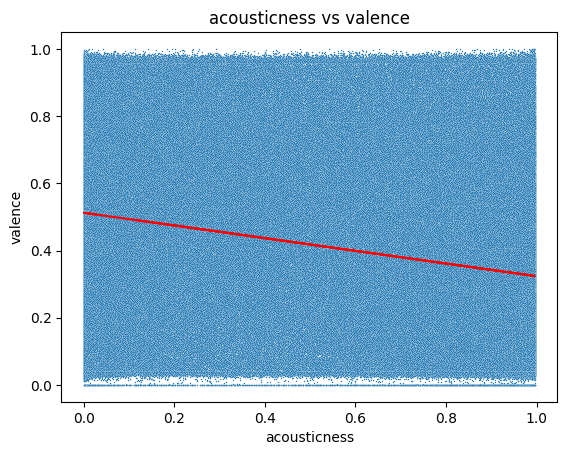

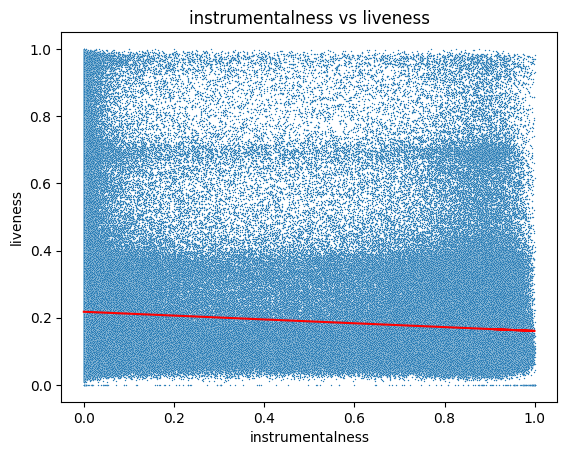

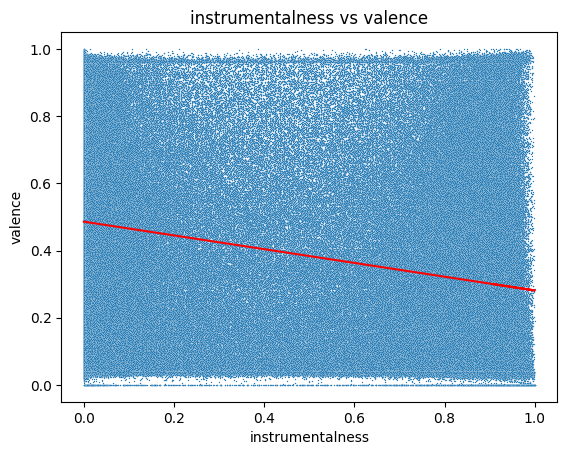

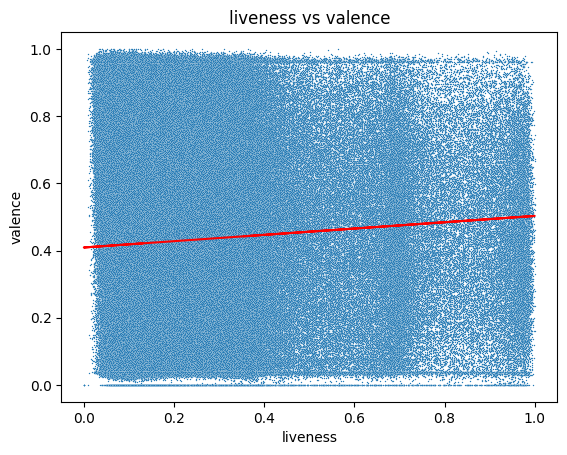

In [ ]:
for i in range(len(regressionFeatures)):
    for j in range(i + 1, len(regressionFeatures)):
        x_feature = np.array(elements[i])
        y_feature = np.array(elements[j])

        sns.scatterplot(x=x_feature, y=y_feature, s = 1)
        slope, intercept = np.polyfit(x_feature, y_feature, 1)
        plt.plot(x_feature, slope * x_feature + intercept, color='red')

        plt.title(f'{regressionFeatures[i]} vs {regressionFeatures[j]}')
        plt.xlabel(regressionFeatures[i])
        plt.ylabel(regressionFeatures[j])
        plt.show()

## 18. Adele and Nothing More...

In [ ]:
adele = dataWithArtists.filter(dataWithArtists['artist'] == "'Adele'")
adele.orderBy('year', ascending=False).select('name', 'release_date', 'duration_min', 'acousticness').show()

+--------------------+------------+------------------+------------------+
|                name|release_date|      duration_min|      acousticness|
+--------------------+------------+------------------+------------------+
|     Hiding My Heart|  2017-05-05|3.4228833333333335|             0.831|
|          I Miss You|  2016-06-24|           5.81045|           0.00936|
|Water Under the B...|  2016-06-24| 4.007116666666667|            0.0189|
|   Sweetest Devotion|  2016-06-24| 4.194883333333333|             0.231|
|  When We Were Young|  2016-06-24|           4.84845|             0.348|
|   Million Years Ago|  2016-06-24|           3.78445|             0.733|
|               Hello|  2016-06-24| 4.924883333333334|             0.336|
|           River Lea|  2016-06-24|3.7571166666666667|            0.0579|
|    Love in the Dark|  2016-06-24| 4.765783333333333|             0.536|
|              Remedy|  2016-06-24|           4.09045|0.8909999999999999|
|           All I Ask|  2016-06-24|   

# Questions

#### 1.  Spark, Hadoop and Lazy-Evaluation


- **Apache Spark**: It operates on distributed data collections and makes use of a data processing model where it reads data into memory and then performs transformations on this data in-memory. It has some features:

    - **Resilient Distributed Dataset (RDD)**: Spark operates on RDDs, which are immutable and distributed collections of objects. Each dataset in an RDD can be divided into logical partitions, which can be computed on different nodes of the cluster.

    - **Transformations and Actions**: Spark RDDs support two types of operations. Transformations create a new dataset from an existing one, while actions return a value to the driver program after running a computation on the dataset. Transformations in Spark are lazily evaluated, which will be elaborated further.

<br>

- **Hadoop** :It uses a more traditional approach where data is read from disk and then processed.

    - **Hadoop Distributed File System (HDFS)**: Hadoop employs a distributed file system, HDFS, that allows data to be stored in an easily accessible format, across a large number of linked storage devices.

    - **MapReduce**: Hadoop MapReduce is a software framework for easily writing applications which process vast amounts of data in parallel on large clusters of commodity hardware in a reliable, fault-tolerant manner. MapReduce allows for distributed processing of the map and reduction operations. It’s designed to process large volumes of data in parallel by dividing the work into a set of independent tasks.

<br>

- **Lazy evaluation**: It means that the execution of an transformations will not start until an action is triggered. In Spark, the transformations are lazy, meaning that they do not compute their results right away. They just remember the transformations applied to some base dataset like a file. The transformations are only computed when an action requires a result to be returned to the driver program.

<br>

- **Example**:

    ```python
    data = [1, 2, 3, 4, 5]
    rdd = sparkContext.parallelize(data)

    rdd = rdd.map(lambda x: x * x) # Lazy evaluated Transformation

    result = rdd.collect() # Action
    ```

    In this example, when we call the map function, it will not immediately execute. It will only get executed when we call an action, like `collect` in this case.

    With Lazy evaluation, Spark can optimize the data processing plan. For example, if we call a map operation followed by a filter operation, Spark will optimize this to do both in a single pass over the data, rather than two separate passes if it were to execute each operation immediately.

#### 2.  Parquet: Handling Large Datasets


When working with large datasets, such as the dataset that was provided for this project, file formats can significantly impact performance and feasibility.

For example, **CSV** is a simple file format used to store tabular data. However, it's not optimized for large datasets. It doesn't support compression and schema evolution, and we have to read the entire file even if we need a small subset of data.

But **Parquet** is a columnar storage file format. Here's how it addresses the issues:

- **Schema Evolution**: Parquet supports schema evolution. We can add new columns to the end of the structure and safely read older files.

- **Efficient Storage**: Parquet stores data by columns, which can lead to more efficient compression. It's especially beneficial when the dataset has many columns, and only a few are queried frequently.

- **Read Efficiency**: Since Parquet is a columnar format, it allows for reading specific columns instead of entire records. This feature can significantly speed up tasks like data analysis where typically only specific columns of data are needed.


#### 3. Apache Spark Checkpoints

We can enforce checkpointing to save the intermediate data of a Spark computation. This can be useful in reducing the computation time for iterative algorithms and long running jobs. We can enforce it with following steps:

1. **Enable Checkpointing**: First, we need to specify a directory where the checkpointed data will be stored. This is done using the `SparkContext`'s `setCheckpointDir` method. Note the `hdfs` in the path, indicating that we’re specifying a location in the HDFS where Spark can save intermediate data, not a location on the web.

    ```python
    sparkContext.setCheckpointDir("hdfs://localhost:9000/checkpoint")
    ```

2. **Checkpoint a RDD**: Then we can checkpoint a RDD using the `checkpoint()` method. This will save the data of the RDD to the directory specified earlier.

    ```python
    rdd.checkpoint()
    ```

Checkpointing in Spark is a lazy operation and can be expensive as it involves saving data to a file system. Therefore, it should be used judiciously and only when necessary. It's often used when the lineage graphs are long and hence costly to compute and recompute. Regular checkpoints can help truncate the lineage graph.


#### 4. Optimizing Data Storage for Efficient Filtering in Big Data Systems

To optimize the process of filtering data based on specific columns, we can use a combination of techniques, such as:


- **Columnar storage**: With using **Apache Parquet** and **Apache ORC** we can store data by columns. This allows for more efficient disk I/O when querying data, as only the necessary columns used in the query are read from disk. It also allows for better compression, as data in the same column is often similar.


- **Indexing**: Indexing is a technique used to speed up data retrieval. An index is a data structure that allows for faster search of data in a column or set of columns.

- **Partitioning**: It is a technique where data is split across multiple files or directories based on the values in one or more columns. For example, if we're storing daily data, we could partition our data by `date`. This way, Spark or Hadoop only needs to read data from the corresponding partition, which can significantly speed up the query.

Here's how we can partition our data in Spark:

```python
df.write.partitionBy("date").parquet("/path/to/data")
```

In this example, the data is saved in the Parquet format and partitioned by the `date` column. When we query this data by date, only the relevant partitions will be read, making the query faster.

While these techniques can significantly improve query performance, they also come with trade-offs. For example, while partitioning can speed up queries, it can also increase the number of files and directories, which can slow down file system operations. So it's important to choose the right strategy based on our specific use case and requirements.

#### 5. Pandas vs. PySpark: The Data Analysis Arena!


- **Pandas**: Pandas is a software library for Python that provides data manipulation and analysis capabilities. It is built on top of two core Python libraries - `NumPy` and `Matplotlib`.

    - **Data Structures**: Pandas introduces two new data structures to Python - DataFrame and Series, both of which are built on top of NumPy. This means they’re fast, and data manipulation is straightforward.
    - **Internal Implementation**: Pandas uses many of NumPy’s methods for computation, and structures its data in DataFrame or Series objects. These objects have functions that allow data manipulation, statistical computation, and complex data operations.
    - **Data Size**: Pandas shines when working with small to medium-sized datasets that can fit into memory.

    - **Processing Complexity**: Pandas is excellent for complex data manipulation tasks. It provides a wide array of functions and methods to perform efficient data manipulations.

    - **User Experience**: Pandas has a very intuitive API, making it a great choice for exploratory data analysis. It's easy to learn and use, especially for those familiar with Python and NumPy.

- **PySpark**: PySpark is the Python library for Apache Spark, an open-source, distributed computing system that provides high-level APIs in Java, Scala, Python and R, and an optimized engine that supports general execution graphs.

    - **Data Structures**: PySpark primarily operates on Resilient Distributed Datasets (RDDs) and DataFrames. RDD is a fundamental data structure of Spark which is an immutable distributed collection of objects.
    
    - **Internal Implementation**: PySpark uses Spark’s core and its additional libraries to perform large scale data processing. It performs operations in an optimized manner across distributed systems. Its computations are done in memory and in real-time, making it faster than Hadoop MapReduce.

    - **Data Size**: PySpark truly shines when dealing with large datasets that don't fit into memory. It can handle distributed processing across multiple nodes, making it suitable for big data processing tasks.

    - **Processing Complexity**: PySpark can handle complex processing tasks on large datasets using distributed computing. It also supports machine learning algorithms through MLlib.

    - **User Experience**: PySpark might have a steeper learning curve compared to Pandas due to its distributed nature. However, it provides powerful data processing capabilities for large datasets.


- **Overall**:
    - If we're working with smaller datasets and doing exploratory data analysis, Pandas is likely the better choice due to its simplicity and powerful data manipulation capabilities.
    - On the other hand, if we have large datasets that don't fit into memory, or some distributed computing need to be performed, PySpark would be more suitable.

# Group Members

* Matin Bazrafshan - 810100093
* Mohammad Reza Nemati - 810100226
* Parva Sharifi - 810100171
* Mohammad Farrahi - 810198451

